# Indoor Scene Change Detection — Training & Evaluation Pipeline

YOLO11s detects objects in a *before* and an *after* photo, the boxes are aligned (camera-shift homography) and matched, and a Random Forest turns the matching evidence into the pair-level change type: **Add**, **Delete** or **Move**.

## 1. Environment Setup

In [1]:
!nvidia-smi

Sun Sep 20 02:46:53 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   37C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!pip install ultralytics pandas numpy scipy scikit-learn matplotlib seaborn opencv-python -q

import os, re, glob, json, shutil
import cv2
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yaml
from PIL import Image as PILImage
from IPython.display import Image as IPyImage, display
from google.colab import files
from scipy.optimize import linear_sum_assignment
from sklearn.base import clone
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, f1_score, roc_curve, auc
from sklearn.model_selection import train_test_split
from ultralytics import YOLO

print("Libraries ready.")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 40.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 8.4 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
Libraries ready.


## 2. Upload Your Demo Before/After Pair

Upload **one** before/after photo pair now. This single pair is reused everywhere below that used to show a gallery of several pairs -- the detector gallery, the matching input/output, the Random Forest input/output, and the end-to-end pipeline trace all run on this one pair only.

Select the BEFORE image:


Saving 0398-before-move-bottle-bedroom-cam-c1-b49-1.jpg to 0398-before-move-bottle-bedroom-cam-c1-b49-1.jpg
Saved -> /content/user_before.jpg

Select the AFTER image:


Saving 0398-after-move-bottle-bedroom-cam-c1-b49-1.jpg to 0398-after-move-bottle-bedroom-cam-c1-b49-1.jpg
Saved -> /content/user_after.jpg



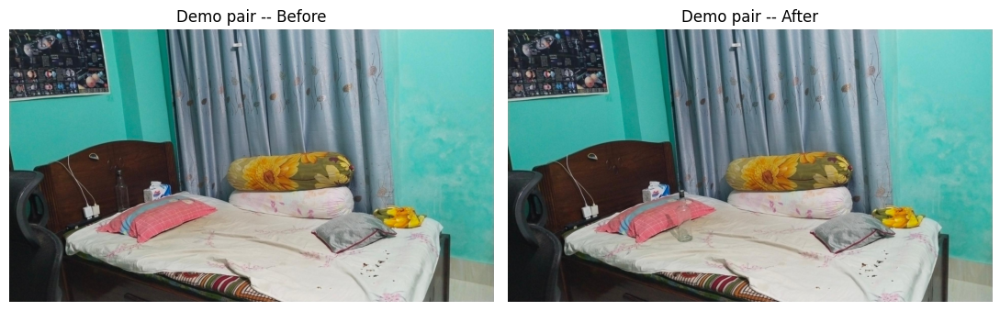

In [3]:
def upload_single_image(label):
    """Prompt the user to pick one image file (BEFORE or AFTER) and save it under /content."""
    print(f"Select the {label} image:")
    uploaded = files.upload()
    assert len(uploaded) == 1, f"Please select exactly one {label} image."
    fname = next(iter(uploaded))
    ext = os.path.splitext(fname)[1] or '.jpg'
    dst = f'/content/user_{label.lower()}{ext}'
    with open(dst, 'wb') as f:
        f.write(uploaded[fname])
    print(f"Saved -> {dst}\n")
    return dst

USER_BEFORE_PATH = upload_single_image('BEFORE')
USER_AFTER_PATH  = upload_single_image('AFTER')

demo_before_raw = cv2.cvtColor(cv2.imread(USER_BEFORE_PATH), cv2.COLOR_BGR2RGB)
demo_after_raw  = cv2.cvtColor(cv2.imread(USER_AFTER_PATH),  cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(11, 4.8))
axes[0].imshow(demo_before_raw); axes[0].axis('off'); axes[0].set_title('Demo pair -- Before', fontsize=12)
axes[1].imshow(demo_after_raw);  axes[1].axis('off'); axes[1].set_title('Demo pair -- After', fontsize=12)
plt.tight_layout()
plt.show()

## 2. Load Dataset

In [4]:
if not os.path.exists('/content/data.zip'):
    print("Select data.zip from your computer:")
    uploaded = files.upload()
    assert 'data.zip' in uploaded, "Upload a file named exactly 'data.zip' (Label Studio YOLO export)."
else:
    print("/content/data.zip already present -- skipping upload.")

/content/data.zip already present -- skipping upload.


In [5]:
!unzip -qo /content/data.zip -d /content/custom_data
!ls -la /content/custom_data

total 452
drwxr-xr-x 4 root root   4096 Sep 20 02:47 .
drwxr-xr-x 1 root root   4096 Sep 20 02:47 ..
-rw-rw-rw- 1 root root    420 Sep  5 23:01 classes.txt
drwxr-xr-x 2 root root 233472 Sep 20 02:47 images
drwxr-xr-x 2 root root 208896 Sep 20 02:47 labels
-rw-rw-rw- 1 root root   3221 Sep  5 23:01 notes.json


In [6]:
required = ['images', 'labels', 'classes.txt']
missing = [r for r in required if not os.path.exists(f'/content/custom_data/{r}')]
if missing:
    raise FileNotFoundError(f"Missing {missing} in /content/custom_data -- check the zip's folder structure.")
print("Folder structure looks correct.")

Folder structure looks correct.


## 3. Exploratory Data Analysis — Raw Images

In [7]:
RAW_IMAGE_DIR = '/content/custom_data/images'
RAW_LABEL_DIR = '/content/custom_data/labels'
CLASSES_TXT   = '/content/custom_data/classes.txt'

raw_images = sorted(glob.glob(os.path.join(RAW_IMAGE_DIR, '*.jpg')) +
                     glob.glob(os.path.join(RAW_IMAGE_DIR, '*.png')))
raw_labels = sorted(glob.glob(os.path.join(RAW_LABEL_DIR, '*.txt')))

with open(CLASSES_TXT) as f:
    class_names = [l.strip() for l in f if l.strip()]

print(f"Images found : {len(raw_images)}")
print(f"Label files  : {len(raw_labels)}")
print(f"Classes ({len(class_names)}): {class_names}")

images_without_labels = [
    p for p in raw_images
    if not os.path.exists(os.path.join(RAW_LABEL_DIR, os.path.splitext(os.path.basename(p))[0] + '.txt'))
]
print(f"Images with no matching label file: {len(images_without_labels)}")

Images found : 2034
Label files  : 2034
Classes (56): ['Bag', 'Basket', 'Blanket', 'Blender', 'Book', 'Bottle', 'Bowl', 'Box', 'Bucket', 'Chair', 'Clock', 'Cooker', 'Cup', 'Door', 'Drawer', 'Electric Iron', 'Fan', 'Floor Mat', 'Food', 'Footwear', 'Glass', 'Jar', 'Jug', 'Kettle', 'Keyboard', 'Keychain', 'Knife', 'Laptop', 'Light', 'Lock', 'Mirror', 'Moneybag', 'Monitor', 'Mop', 'Mouse', 'Mug', 'Notebook', 'Pan', 'Pen Stand', 'Phone', 'Photo', 'Pillow', 'Plant', 'Plate', 'Pot', 'Rack', 'Remote', 'Soap', 'Spoon', 'Stool', 'Table', 'Table Lamp', 'Towel', 'Tray', 'Umbrella', 'Window']
Images with no matching label file: 143


Image size / file-size summary (sampled):


,width,height,file_kb,aspect_ratio
count,300.000000,300.000000,300.000000,300.000000
mean,1818.706667,1074.510000,196.855163,1.705362
std,311.929298,154.292917,61.704992,0.228279
min,899.000000,720.000000,95.295898,0.561979
25%,1920.000000,1080.000000,155.279053,1.777778
50%,1920.000000,1080.000000,191.665527,1.777778
75%,1920.000000,1080.000000,220.842773,1.777778
max,3840.000000,2160.000000,676.202148,1.777778


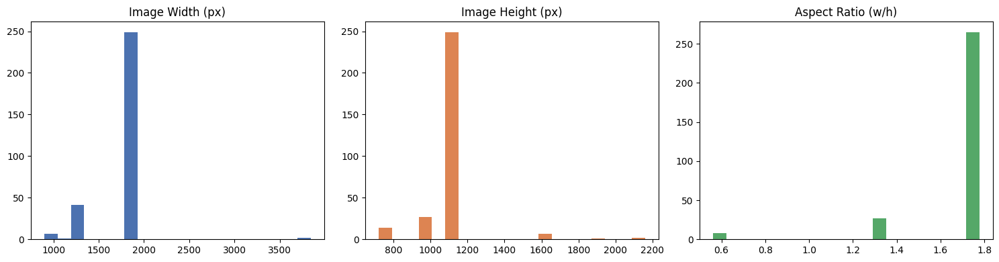

In [8]:
sample_n = min(300, len(raw_images))
rng = np.random.default_rng(42)
sample_paths = rng.choice(raw_images, size=sample_n, replace=False)

dims, file_sizes = [], []
for p in sample_paths:
    with PILImage.open(p) as im:
        dims.append(im.size)  # (w, h)
    file_sizes.append(os.path.getsize(p) / 1024)  # KB

widths, heights = zip(*dims)
dim_df = pd.DataFrame({'width': widths, 'height': heights, 'file_kb': file_sizes})
dim_df['aspect_ratio'] = dim_df['width'] / dim_df['height']

print("Image size / file-size summary (sampled):")
display(dim_df.describe())

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].hist(dim_df['width'], bins=20, color='#4C72B0'); axes[0].set_title('Image Width (px)')
axes[1].hist(dim_df['height'], bins=20, color='#DD8452'); axes[1].set_title('Image Height (px)')
axes[2].hist(dim_df['aspect_ratio'], bins=20, color='#55A868'); axes[2].set_title('Aspect Ratio (w/h)')
plt.tight_layout()
plt.show()

Object instances per class (raw labels):


,class,instances,pct_of_total
0,Pillow,988,6.6
1,Jar,974,6.5
2,Table,960,6.4
3,Chair,910,6.1
4,Bottle,790,5.3
5,Door,667,4.4
6,Pot,554,3.7
7,Book,552,3.7
8,Window,475,3.2
9,Footwear,466,3.1


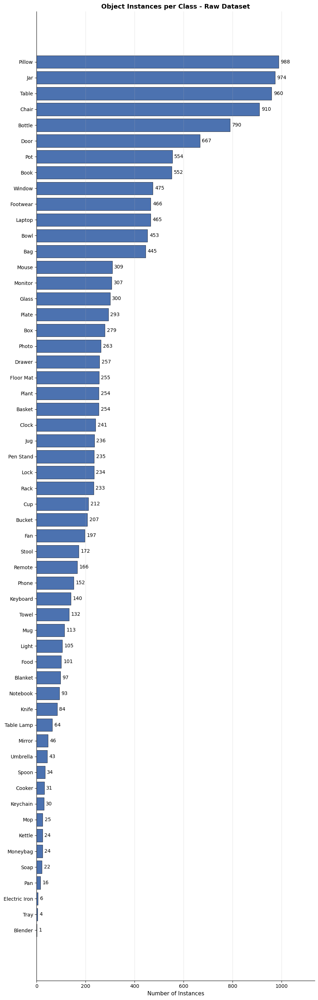

In [9]:
class_counts = {c: 0 for c in class_names}
boxes_per_image = []

for lp in raw_labels:
    with open(lp) as f:
        lines = [l.strip() for l in f if l.strip()]
    boxes_per_image.append(len(lines))
    for line in lines:
        cls_id = int(line.split()[0])
        if 0 <= cls_id < len(class_names):
            class_counts[class_names[cls_id]] += 1

class_count_df = pd.Series(class_counts).sort_values(ascending=False)
total_instances = class_count_df.sum()

report_table = pd.DataFrame({
    'class': class_count_df.index,
    'instances': class_count_df.values,
    'pct_of_total': (class_count_df.values / total_instances * 100).round(1)
})
print("Object instances per class (raw labels):")
display(report_table)

plot_order = class_count_df.sort_values(ascending=True)
fig, ax = plt.subplots(figsize=(9, max(3.5, 0.5 * len(plot_order))))
bars = ax.barh(plot_order.index, plot_order.values, color='#4C72B0', edgecolor='black', linewidth=0.5)
ax.bar_label(bars, padding=4, fontsize=10)
ax.set_xlim(0, plot_order.max() * 1.15)
ax.set_xlabel('Number of Instances', fontsize=11)
ax.set_title('Object Instances per Class - Raw Dataset', fontsize=13, fontweight='bold')
ax.grid(axis='x', alpha=0.3)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
plt.tight_layout()
plt.savefig('/content/class_distribution_raw.png', dpi=300, bbox_inches='tight')
plt.show()

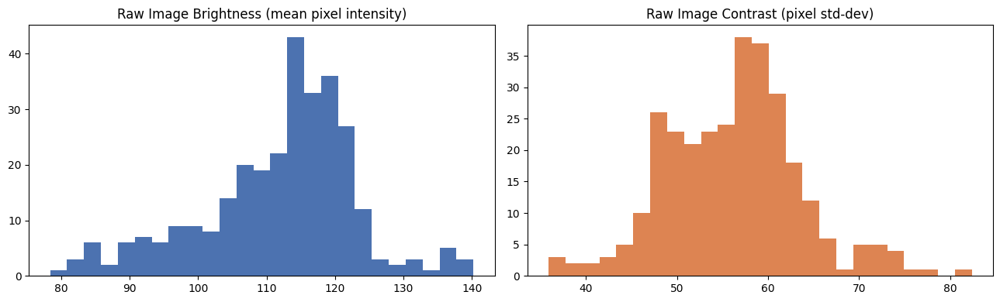

Mean brightness: 111.9  |  Mean contrast: 56.3


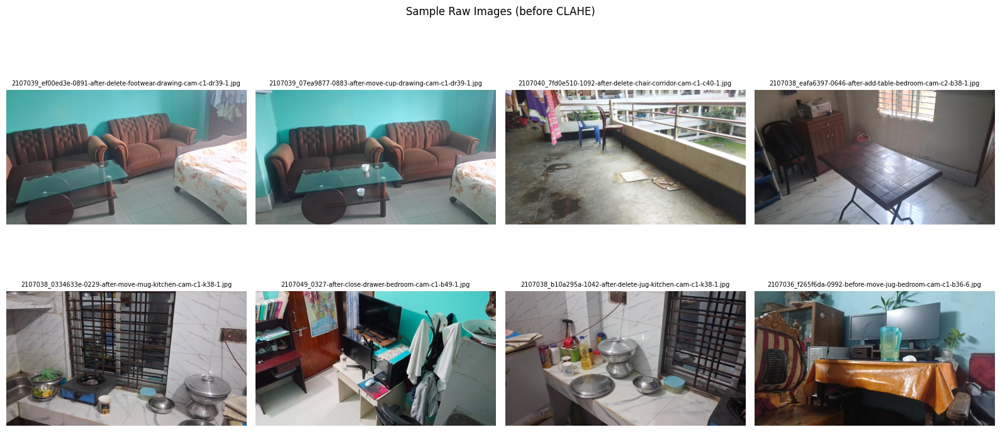

In [10]:
def image_brightness_contrast(path):
    img = cv2.imread(path)
    if img is None:
        return None, None
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return gray.mean(), gray.std()

bright_vals, contrast_vals = [], []
for p in sample_paths:
    b, c = image_brightness_contrast(p)
    if b is not None:
        bright_vals.append(b); contrast_vals.append(c)

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
axes[0].hist(bright_vals, bins=25, color='#4C72B0')
axes[0].set_title('Raw Image Brightness (mean pixel intensity)')
axes[1].hist(contrast_vals, bins=25, color='#DD8452')
axes[1].set_title('Raw Image Contrast (pixel std-dev)')
plt.tight_layout()
plt.show()

print(f"Mean brightness: {np.mean(bright_vals):.1f}  |  Mean contrast: {np.mean(contrast_vals):.1f}")

# Sample grid of raw images
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for ax, p in zip(axes.ravel(), rng.choice(raw_images, size=8, replace=False)):
    img = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
    ax.imshow(img); ax.set_title(os.path.basename(p), fontsize=7); ax.axis('off')
plt.suptitle('Sample Raw Images (before CLAHE)')
plt.tight_layout()
plt.show()

## 4. Preprocessing — CLAHE

### 4a. Apply CLAHE (originals are backed up to `images_original/`)

In [11]:
def equalize_clahe(img_bgr, clip_limit=2.5, tile_grid_size=(8, 8)):
    """BGR image -> BGR image, CLAHE applied to the lightness channel only (colour preserved)."""
    lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    l_eq = clahe.apply(l)
    lab_eq = cv2.merge((l_eq, a, b))
    return cv2.cvtColor(lab_eq, cv2.COLOR_LAB2BGR)

CLAHE_CLIP_LIMIT = 2.5
CLAHE_TILE_GRID = (8, 8)
ORIG_BACKUP_DIR = '/content/custom_data/images_original'

def preprocess_dataset_histogram_eq(image_dir, clip_limit=CLAHE_CLIP_LIMIT,
                                     tile_grid_size=CLAHE_TILE_GRID, backup=True):
    """Equalize every image in image_dir in place. Originals are copied to <image_dir>_original first; if that backup already exists the step is skipped so CLAHE is never applied twice."""
    paths = glob.glob(os.path.join(image_dir, '*.jpg')) + glob.glob(os.path.join(image_dir, '*.png'))
    if not paths:
        print(f"No images found in {image_dir} -- nothing to equalize.")
        return

    if backup:
        backup_dir = image_dir.rstrip('/') + '_original'
        if not os.path.exists(backup_dir):
            os.makedirs(backup_dir)
            for p in paths:
                shutil.copy2(p, os.path.join(backup_dir, os.path.basename(p)))
            print(f"Backed up {len(paths)} original images to {backup_dir}")
        else:
            print(f"Backup dir {backup_dir} already exists -- skipping backup "
                  f"(assuming equalization already ran once; re-running would double-apply CLAHE).")
            return

    n_ok, n_fail = 0, 0
    for p in paths:
        img = cv2.imread(p)
        if img is None:
            n_fail += 1
            continue
        eq = equalize_clahe(img, clip_limit=clip_limit, tile_grid_size=tile_grid_size)
        cv2.imwrite(p, eq)
        n_ok += 1
    print(f"Histogram-equalized {n_ok} images in place in {image_dir} ({n_fail} unreadable/skipped).")

preprocess_dataset_histogram_eq('/content/custom_data/images')

# CLAHE-preprocessed version of the single demo pair uploaded above (in-memory + saved to disk),
# reused by every gallery/section below instead of looping over several dataset pairs.
demo_before_bgr = cv2.imread(USER_BEFORE_PATH)
demo_after_bgr  = cv2.imread(USER_AFTER_PATH)
demo_before_pre = equalize_clahe(demo_before_bgr, CLAHE_CLIP_LIMIT, CLAHE_TILE_GRID)
demo_after_pre  = equalize_clahe(demo_after_bgr,  CLAHE_CLIP_LIMIT, CLAHE_TILE_GRID)

DEMO_BEFORE_PRE_PATH = '/content/user_before_clahe.jpg'
DEMO_AFTER_PRE_PATH  = '/content/user_after_clahe.jpg'
cv2.imwrite(DEMO_BEFORE_PRE_PATH, demo_before_pre)
cv2.imwrite(DEMO_AFTER_PRE_PATH, demo_after_pre)
print('CLAHE applied to the demo pair ->', DEMO_BEFORE_PRE_PATH, DEMO_AFTER_PRE_PATH)

Backed up 2034 original images to /content/custom_data/images_original
Histogram-equalized 2034 images in place in /content/custom_data/images (0 unreadable/skipped).
CLAHE applied to the demo pair -> /content/user_before_clahe.jpg /content/user_after_clahe.jpg


### 4b. EDA After Preprocessing

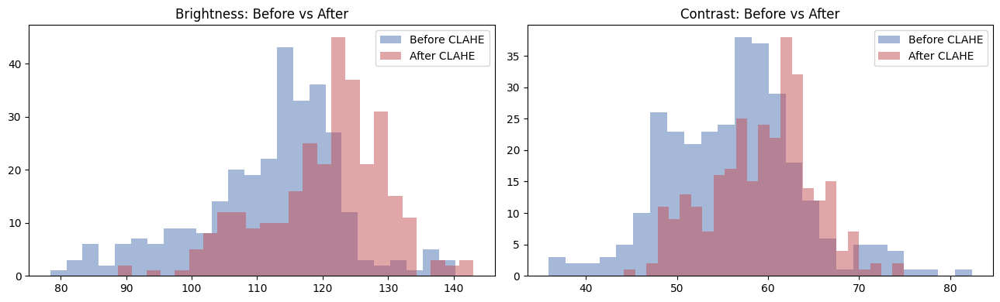

Mean brightness  -> before: 111.9, after: 120.4
Mean contrast    -> before: 56.3, after: 59.4


In [12]:
bright_after, contrast_after = [], []
for p in sample_paths:
    b, c = image_brightness_contrast(p)   # sample_paths now point at the equalized files
    if b is not None:
        bright_after.append(b); contrast_after.append(c)

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
axes[0].hist(bright_vals, bins=25, alpha=0.5, label='Before CLAHE', color='#4C72B0')
axes[0].hist(bright_after, bins=25, alpha=0.5, label='After CLAHE', color='#C44E52')
axes[0].set_title('Brightness: Before vs After'); axes[0].legend()

axes[1].hist(contrast_vals, bins=25, alpha=0.5, label='Before CLAHE', color='#4C72B0')
axes[1].hist(contrast_after, bins=25, alpha=0.5, label='After CLAHE', color='#C44E52')
axes[1].set_title('Contrast: Before vs After'); axes[1].legend()
plt.tight_layout()
plt.show()

print(f"Mean brightness  -> before: {np.mean(bright_vals):.1f}, after: {np.mean(bright_after):.1f}")
print(f"Mean contrast    -> before: {np.mean(contrast_vals):.1f}, after: {np.mean(contrast_after):.1f}")

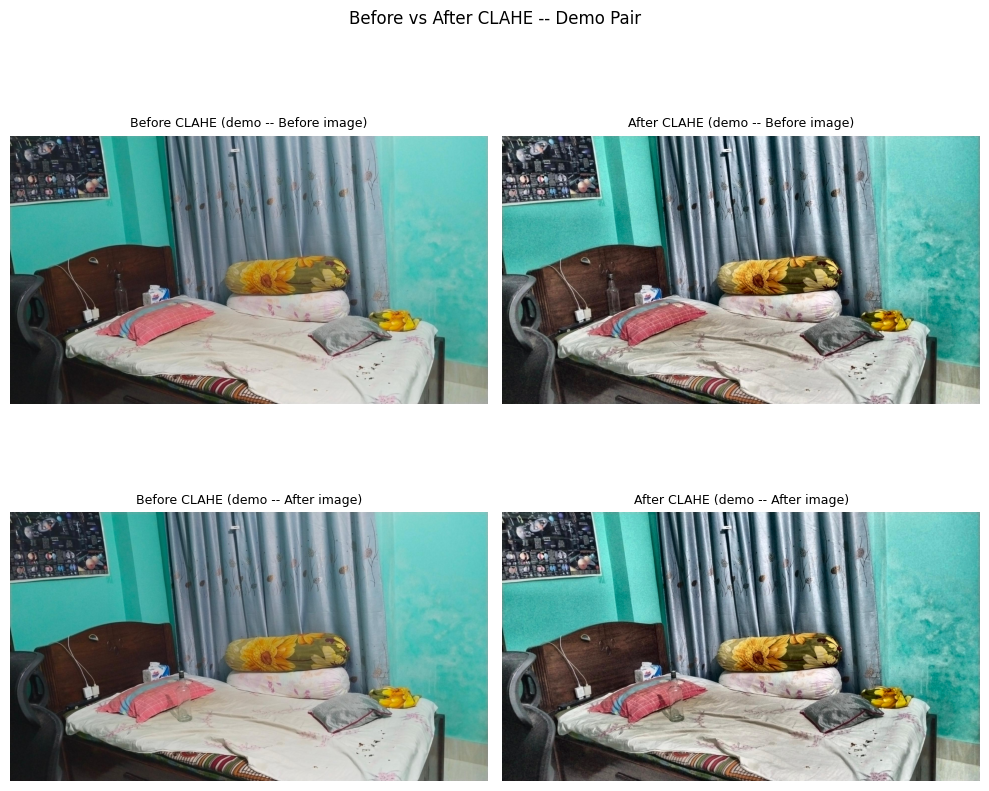

In [13]:
demo_before_pre_rgb = cv2.cvtColor(demo_before_pre, cv2.COLOR_BGR2RGB)
demo_after_pre_rgb  = cv2.cvtColor(demo_after_pre,  cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(2, 2, figsize=(10, 9))
axes[0, 0].imshow(demo_before_raw);     axes[0, 0].set_title('Before CLAHE (demo -- Before image)', fontsize=9); axes[0, 0].axis('off')
axes[0, 1].imshow(demo_before_pre_rgb); axes[0, 1].set_title('After CLAHE (demo -- Before image)', fontsize=9);  axes[0, 1].axis('off')
axes[1, 0].imshow(demo_after_raw);      axes[1, 0].set_title('Before CLAHE (demo -- After image)', fontsize=9);  axes[1, 0].axis('off')
axes[1, 1].imshow(demo_after_pre_rgb);  axes[1, 1].set_title('After CLAHE (demo -- After image)', fontsize=9);   axes[1, 1].axis('off')
plt.suptitle('Before vs After CLAHE -- Demo Pair')
plt.tight_layout()
plt.show()

## 5. Pair-Level Train / Validation / Test Split (70 / 15 / 15)

In [14]:
IMAGE_DIR = '/content/custom_data/images'
LABEL_DIR = '/content/custom_data/labels'

ALL_IMAGES = glob.glob(os.path.join(IMAGE_DIR, '*.jpg')) + glob.glob(os.path.join(IMAGE_DIR, '*.png'))
print(f"Found {len(ALL_IMAGES)} images in {IMAGE_DIR}")

CHANGE_TYPES = ['add', 'delete', 'move']
KNOWN_ROOMS = ['bedroom', 'kitchen', 'dining', 'corridor', 'drawing']

FILENAME_PATTERN = re.compile(
    r'(?P<pair_id>\d+)-(?P<stage>before|after)-(?P<change_type>' + '|'.join(CHANGE_TYPES) + r')-'
    r'(?P<object>.+?)-(?P<room>' + '|'.join(KNOWN_ROOMS) + r')-cam-'
    r'(?P<camera_id>[^-]+)-(?P<member_roll>[^-]+)-(?P<seq>\d+)',
    re.IGNORECASE
)

def parse_filename(path):
    stem = os.path.splitext(os.path.basename(path))[0]
    m = FILENAME_PATTERN.search(stem)
    if not m:
        return None
    d = m.groupdict()
    d['path'] = path
    d['stage'] = d['stage'].lower()
    d['change_type'] = d['change_type'].lower()
    return d

parsed = [p for p in (parse_filename(f) for f in ALL_IMAGES) if p is not None]
skipped_files = [f for f in ALL_IMAGES if parse_filename(f) is None]
if skipped_files:
    print(f"NOTE: {len(skipped_files)} filenames didn't match add/delete/move and were dropped")
    print("(this includes any open/close/on/off pairs, plus any genuinely malformed names).")
    print("First 5 examples:")
    for f in skipped_files[:5]:
        print(" ", os.path.basename(f))

meta_df = pd.DataFrame(parsed)
print(f"\nKept {len(meta_df)} images with change_type in {CHANGE_TYPES}.")
meta_df.head()

Found 2034 images in /content/custom_data/images
NOTE: 76 filenames didn't match add/delete/move and were dropped
(this includes any open/close/on/off pairs, plus any genuinely malformed names).
First 5 examples:
  2107049_0386-after-open-drawer-bedroom-cam-c1-b49-1.jpg
  2107049_0353-after-open-door-bedroom-cam-c1-b49-1.jpg
  2107060_ab4e72e1-0422-before-close-umbrella-bedroom-cam-c2-b60-1.jpg
  2107040_f5efea16-0513-before-delete-bottle-bedroom-cam-c1-b40.jpg
  2107040_52e9612b-0513-after-delete-bottle-bedroom-cam-c1-b40.jpg

Kept 1958 images with change_type in ['add', 'delete', 'move'].


,pair_id,stage,change_type,object,room,camera_id,member_roll,seq,path
0,0996,after,delete,mouse,bedroom,c1,b36,6,/content/custom_data/images/2107036_efc47446-0...
1,0660,after,move,notebook,bedroom,c2,b38,1,/content/custom_data/images/2107038_92ca588f-0...
2,0884,before,add,food,drawing,c1,dr39,1,/content/custom_data/images/2107039_5533d718-0...
3,0279,before,move,basket,corridor,c1,c36,2,/content/custom_data/images/2107036_92b8c41e-0...
4,1066,before,move,pen_stand,bedroom,c1,b36,6,/content/custom_data/images/2107036_67518497-1...


In [15]:
_pairs = []
_bad_pairs = []
for pid, grp in meta_df.groupby('pair_id'):
    befores = grp[grp['stage'] == 'before']
    afters = grp[grp['stage'] == 'after']
    if len(befores) != 1 or len(afters) != 1:
        _bad_pairs.append((pid, len(befores), len(afters)))
        continue
    b, a = befores.iloc[0], afters.iloc[0]
    _pairs.append({
        'pair_id': pid, 'before_path': b['path'], 'after_path': a['path'],
        'change_type': a['change_type'], 'object': a['object'], 'room': a['room'],
    })
if _bad_pairs:
    print(f"WARNING: {len(_bad_pairs)} pair_ids didn't have exactly 1 before + 1 after file -- skipped:")
    for pid, nb_, na_ in _bad_pairs[:10]:
        print(f"  pair_id={pid}: {nb_} before, {na_} after")

ALL_PAIRS_DF = pd.DataFrame(_pairs)
print(f"Built {len(ALL_PAIRS_DF)} total before/after pairs (Add/Delete/Move only).")

TRAIN_FRAC, VAL_FRAC, TEST_FRAC = 0.70, 0.15, 0.15
assert abs(TRAIN_FRAC + VAL_FRAC + TEST_FRAC - 1.0) < 1e-9

_labels = ALL_PAIRS_DF['change_type']
_min_class_count = _labels.value_counts().min()
_stratify_ok = _min_class_count >= 2

train_ids, temp_ids = train_test_split(
    ALL_PAIRS_DF['pair_id'], train_size=TRAIN_FRAC, random_state=42,
    stratify=_labels if _stratify_ok else None)

temp_labels = ALL_PAIRS_DF.set_index('pair_id').loc[temp_ids, 'change_type']
_temp_stratify_ok = temp_labels.value_counts().min() >= 2
val_ids, test_ids = train_test_split(
    temp_ids, train_size=VAL_FRAC / (VAL_FRAC + TEST_FRAC), random_state=42,
    stratify=temp_labels if _temp_stratify_ok else None)

split_map = {pid: 'train' for pid in train_ids}
split_map.update({pid: 'validation' for pid in val_ids})
split_map.update({pid: 'test' for pid in test_ids})
ALL_PAIRS_DF['split'] = ALL_PAIRS_DF['pair_id'].map(split_map)

print("\nSplit sizes (pairs):")
print(ALL_PAIRS_DF['split'].value_counts())
print("\nChange-type balance across splits:")
print(ALL_PAIRS_DF.groupby('split')['change_type'].value_counts().unstack(fill_value=0))

  pair_id=0190: 2 before, 2 after
  pair_id=0211: 2 before, 2 after
  pair_id=0245: 2 before, 2 after
  pair_id=0296: 2 before, 2 after
  pair_id=0332: 2 before, 2 after
  pair_id=0416: 2 before, 1 after
  pair_id=0417: 2 before, 2 after
  pair_id=0418: 2 before, 1 after
  pair_id=0419: 2 before, 2 after
  pair_id=0421: 1 before, 2 after
Built 915 total before/after pairs (Add/Delete/Move only).

Split sizes (pairs):
split
train         640
test          138
validation    137
Name: count, dtype: int64

Change-type balance across splits:
change_type  add  delete  move
split                         
test          50      43    45
train        232     199   209
validation    50      43    44


In [16]:
DATA_ROOT = '/content/data'
shutil.rmtree(DATA_ROOT, ignore_errors=True)   # start clean so a re-run never mixes old and new splits
missing_labels = []

def _copy_one(img_path, split):
    img_name = os.path.basename(img_path)
    stem = os.path.splitext(img_name)[0]
    dst_img_dir = os.path.join(DATA_ROOT, split, 'images')
    dst_lbl_dir = os.path.join(DATA_ROOT, split, 'labels')
    os.makedirs(dst_img_dir, exist_ok=True)
    os.makedirs(dst_lbl_dir, exist_ok=True)
    shutil.copy2(img_path, os.path.join(dst_img_dir, img_name))
    label_src = os.path.join(LABEL_DIR, stem + '.txt')
    if os.path.exists(label_src):
        shutil.copy2(label_src, os.path.join(dst_lbl_dir, stem + '.txt'))
    else:
        missing_labels.append(img_name)

for _, row in ALL_PAIRS_DF.iterrows():
    _copy_one(row['before_path'], row['split'])
    _copy_one(row['after_path'], row['split'])

if missing_labels:
    print(f"WARNING: {len(missing_labels)} images had no matching .txt label file -- "
          f"first 5: {missing_labels[:5]}")

print("Images copied per split:")
for split in ['train', 'validation', 'test']:
    n_img = len(glob.glob(f'{DATA_ROOT}/{split}/images/*'))
    n_lbl = len(glob.glob(f'{DATA_ROOT}/{split}/labels/*'))
    print(f"  {split}: {n_img} images, {n_lbl} labels")
    if n_img == 0:
        raise RuntimeError(f"{split} folder is empty -- check the split/copy logic above.")

Images copied per split:
  train: 1280 images, 1185 labels
  validation: 274 images, 264 labels
  test: 276 images, 262 labels


### 5b. Dataset distribution charts

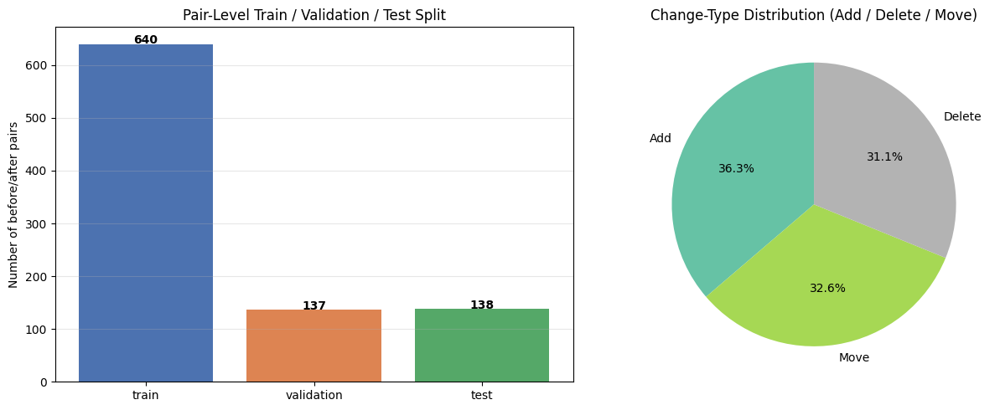

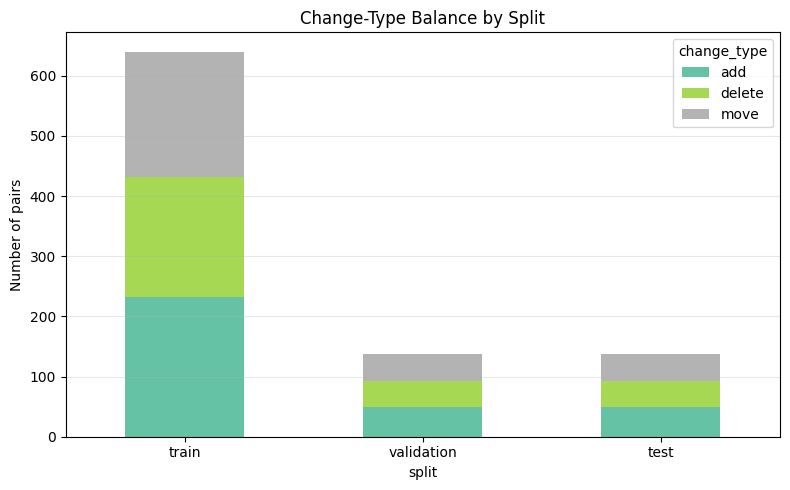

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

split_counts = ALL_PAIRS_DF['split'].value_counts().reindex(['train', 'validation', 'test'])
axes[0].bar(split_counts.index, split_counts.values, color=['#4C72B0', '#DD8452', '#55A868'])
for i, v in enumerate(split_counts.values):
    axes[0].text(i, v + 0.5, str(int(v)), ha='center', fontweight='bold')
axes[0].set_title('Pair-Level Train / Validation / Test Split')
axes[0].set_ylabel('Number of before/after pairs')
axes[0].grid(alpha=0.3, axis='y')

type_counts = ALL_PAIRS_DF['change_type'].value_counts()
colors = plt.cm.Set2(np.linspace(0, 1, len(type_counts)))
axes[1].pie(type_counts.values, labels=[c.capitalize() for c in type_counts.index],
            autopct='%1.1f%%', colors=colors, startangle=90)
axes[1].set_title('Change-Type Distribution (Add / Delete / Move)')

plt.tight_layout()
plt.savefig('/content/dataset_distribution.png', dpi=150)
plt.show()

by_split = ALL_PAIRS_DF.groupby('split')['change_type'].value_counts().unstack(fill_value=0)
by_split = by_split.reindex(['train', 'validation', 'test'])
by_split.plot(kind='bar', stacked=True, figsize=(8, 5), colormap='Set2')
plt.title('Change-Type Balance by Split')
plt.ylabel('Number of pairs')
plt.xticks(rotation=0)
plt.legend(title='change_type')
plt.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.savefig('/content/dataset_distribution_by_split.png', dpi=150)
plt.show()

## 6. Create data.yaml

In [18]:
def create_data_yaml(path_to_classes_txt, path_to_data_yaml):
    if not os.path.exists(path_to_classes_txt):
        raise FileNotFoundError(f'classes.txt not found at {path_to_classes_txt}')
    with open(path_to_classes_txt, 'r') as f:
        classes = [line.strip() for line in f.readlines() if line.strip()]
    data = {
        'path': '/content/data',
        'train': 'train/images',
        'val': 'validation/images',
        'test': 'test/images',
        'nc': len(classes),
        'names': classes
    }
    with open(path_to_data_yaml, 'w') as f:
        yaml.dump(data, f, sort_keys=False)
    print(f"Created {path_to_data_yaml} with {len(classes)} classes")
    return classes

CLASSES = create_data_yaml('/content/custom_data/classes.txt', '/content/data.yaml')
!cat /content/data.yaml

Created /content/data.yaml with 56 classes
path: /content/data
train: train/images
val: validation/images
test: test/images
nc: 56
names:
- Bag
- Basket
- Blanket
- Blender
- Book
- Bottle
- Bowl
- Box
- Bucket
- Chair
- Clock
- Cooker
- Cup
- Door
- Drawer
- Electric Iron
- Fan
- Floor Mat
- Food
- Footwear
- Glass
- Jar
- Jug
- Kettle
- Keyboard
- Keychain
- Knife
- Laptop
- Light
- Lock
- Mirror
- Moneybag
- Monitor
- Mop
- Mouse
- Mug
- Notebook
- Pan
- Pen Stand
- Phone
- Photo
- Pillow
- Plant
- Plate
- Pot
- Rack
- Remote
- Soap
- Spoon
- Stool
- Table
- Table Lamp
- Towel
- Tray
- Umbrella
- Window


## 7. Train YOLO11s

In [19]:
EPOCHS = 60
IMGSZ = 640
shutil.rmtree('/content/runs/yolo11s', ignore_errors=True)   # re-runs overwrite instead of creating yolo11s2
!yolo detect train data=/content/data.yaml model=yolo11s.pt epochs={EPOCHS} imgsz={IMGSZ} \
    project=/content/runs name=yolo11s

Ultralytics 8.4.156 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11s, nbs=64, nms=None, opset=None, optimize=False, opt

In [20]:
YOLO_WEIGHTS = '/content/runs/yolo11s/weights/best.pt'
assert os.path.exists(YOLO_WEIGHTS), "YOLO11s training did not produce best.pt — check the training log above."
print("YOLO11s weights:", YOLO_WEIGHTS)

YOLO11s weights: /content/runs/yolo11s/weights/best.pt


### 7b. Training curves

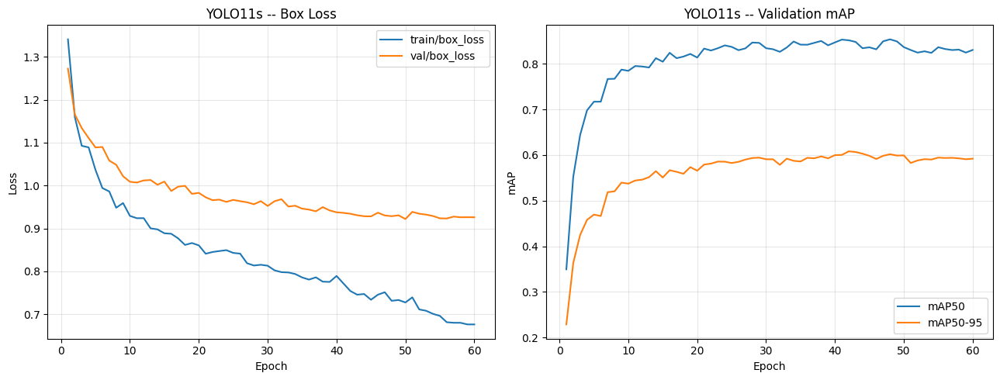

In [21]:
yolo_results_csv = '/content/runs/yolo11s/results.csv'
if os.path.exists(yolo_results_csv):
    yolo_hist = pd.read_csv(yolo_results_csv)
    yolo_hist.columns = [c.strip() for c in yolo_hist.columns]

    fig, axes = plt.subplots(1, 2, figsize=(13, 5))
    axes[0].plot(yolo_hist['epoch'], yolo_hist['train/box_loss'], label='train/box_loss')
    axes[0].plot(yolo_hist['epoch'], yolo_hist['val/box_loss'], label='val/box_loss')
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
    axes[0].set_title('YOLO11s -- Box Loss'); axes[0].legend(); axes[0].grid(alpha=0.3)

    axes[1].plot(yolo_hist['epoch'], yolo_hist['metrics/mAP50(B)'], label='mAP50')
    axes[1].plot(yolo_hist['epoch'], yolo_hist['metrics/mAP50-95(B)'], label='mAP50-95')
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('mAP')
    axes[1].set_title('YOLO11s -- Validation mAP'); axes[1].legend(); axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.savefig('/content/yolo11s_training_curves.png', dpi=150)
    plt.show()
else:
    print(f"{yolo_results_csv} not found -- run the training cell first.")

## 8. Evaluate YOLO11s

### 8a. Validation split

In [22]:
METRIC_COLS = ['model', 'mAP50', 'mAP50-95', 'precision', 'recall', 'f1']

def evaluate_yolo(model_path, model_name, data_yaml, split):
    """Run Ultralytics validation on one split ('val' or 'test'). Returns a dict of metrics and the output dir."""
    model = YOLO(model_path)
    results = model.val(data=data_yaml, split=split)
    p, r = results.box.mp, results.box.mr
    return {
        'model': model_name, 'split': split,
        'mAP50': results.box.map50, 'mAP50-95': results.box.map,
        'precision': p, 'recall': r, 'f1': 2 * p * r / (p + r + 1e-9),
        'save_dir': str(results.save_dir),
    }

yolo_val_metrics = evaluate_yolo(YOLO_WEIGHTS, 'YOLO11s', '/content/data.yaml', 'val')
comparison_df = pd.DataFrame([yolo_val_metrics])[METRIC_COLS]
comparison_df

Ultralytics 8.4.156 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 100 layers, 9,434,472 parameters, 0 gradients, 21.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4081.7±549.6 MB/s, size: 517.4 KB)
val: Scanning /content/data/validation/labels.cache... 264 images, 10 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 274/274 50.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 3.3it/s 5.5s
                   all        274       1705      0.885      0.785      0.853      0.609
                   Bag         47         48      0.909      0.832      0.935      0.656
                Basket         20         27      0.981      0.852       0.91      0.632
               Blanket         14         14      0.805      0.786      0.863      0.675
                  Book         57         79      0.976      0.873      0.922      0.602
                Bottle         81       

,model,mAP50,mAP50-95,precision,recall,f1
0,YOLO11s,0.852839,0.608625,0.88477,0.784686,0.831728


### 8b. Test split (final, evaluated once)

In [23]:
yolo_test_metrics = evaluate_yolo(YOLO_WEIGHTS, 'YOLO11s', '/content/data.yaml', 'test')
comparison_test_df = pd.DataFrame([yolo_test_metrics])
comparison_test_df

Ultralytics 8.4.156 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 100 layers, 9,434,472 parameters, 0 gradients, 21.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 94.3±37.9 MB/s, size: 610.1 KB)
val: Scanning /content/data/test/labels... 262 images, 14 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 276/276 362.0it/s 0.8s
val: New cache created: /content/data/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 2.9it/s 6.1s
                   all        276       1830      0.845      0.801      0.849      0.619
                   Bag         60         66      0.933      0.839       0.93       0.62
                Basket         12         17      0.915      0.824      0.823      0.483
               Blanket          2          2      0.692          1      0.995       0.92
                  Book         59         85      0.915      0.759      0.847      0.586

,model,split,mAP50,mAP50-95,precision,recall,f1,save_dir
0,YOLO11s,test,0.849481,0.61865,0.84495,0.801033,0.822405,/content/runs/detect/val-2


### 8c. Test metrics chart

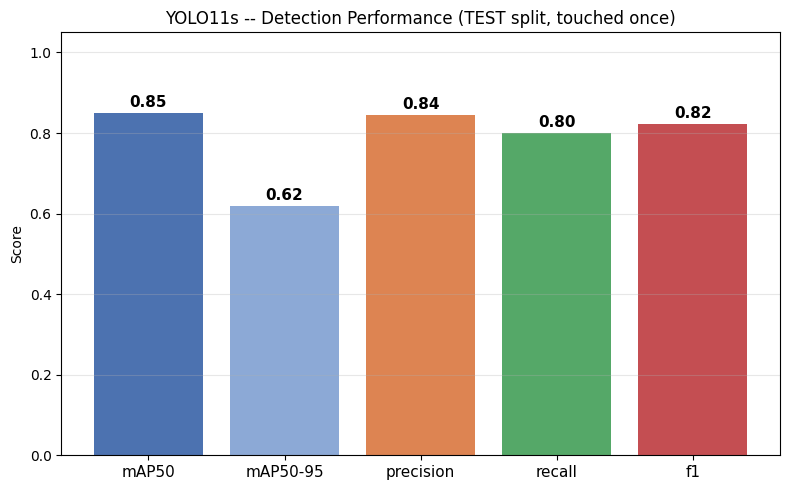

In [24]:
metric_cols = ['mAP50', 'mAP50-95', 'precision', 'recall', 'f1']
metrics_series = comparison_test_df.set_index('model')[metric_cols].iloc[0]

fig, ax = plt.subplots(figsize=(8, 5))
bar_colors = ['#4C72B0', '#8CA9D6', '#DD8452', '#55A868', '#C44E52']
bars = ax.bar(metrics_series.index, metrics_series.values, color=bar_colors)
plt.title('YOLO11s -- Detection Performance (TEST split, touched once)')
plt.ylabel('Score')
plt.xticks(rotation=0, fontsize=11)
plt.ylim(0, 1.05)
plt.grid(alpha=0.3, axis='y')
for b, v in zip(bars, metrics_series.values):
    ax.text(b.get_x() + b.get_width() / 2, v + 0.015, f'{v:.2f}', ha='center', fontweight='bold', fontsize=11)
plt.tight_layout()
plt.savefig('/content/model_comparison_test.png', dpi=150)
plt.show()

### 8d. Test confusion matrix and curves

YOLO11s -- TEST split (from /content/runs/detect/val-2):


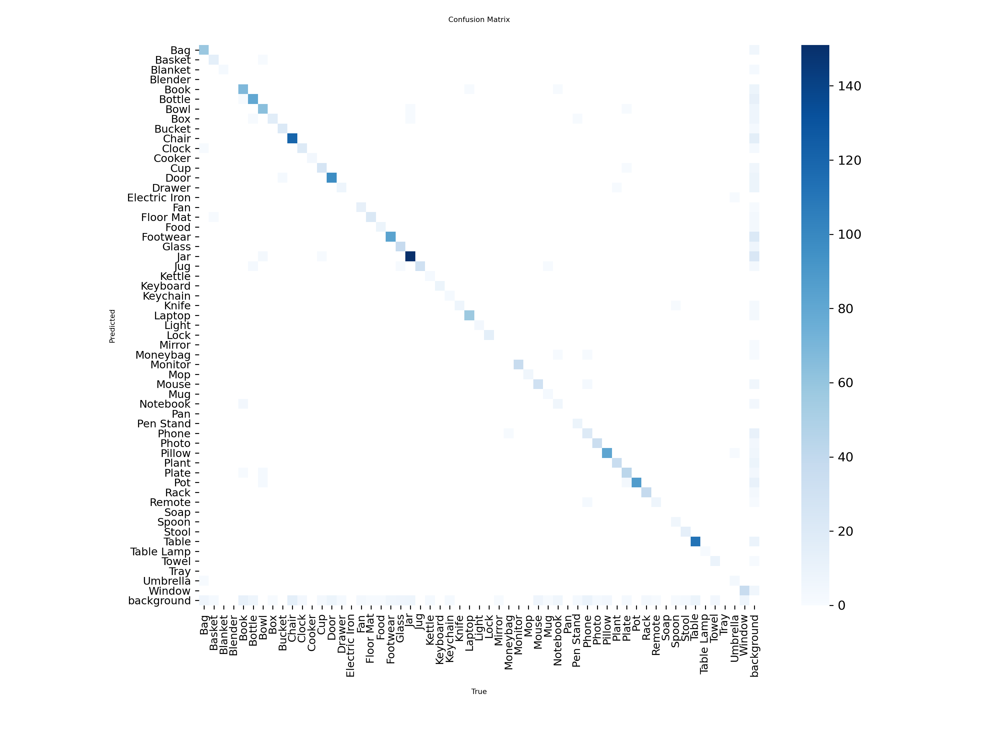

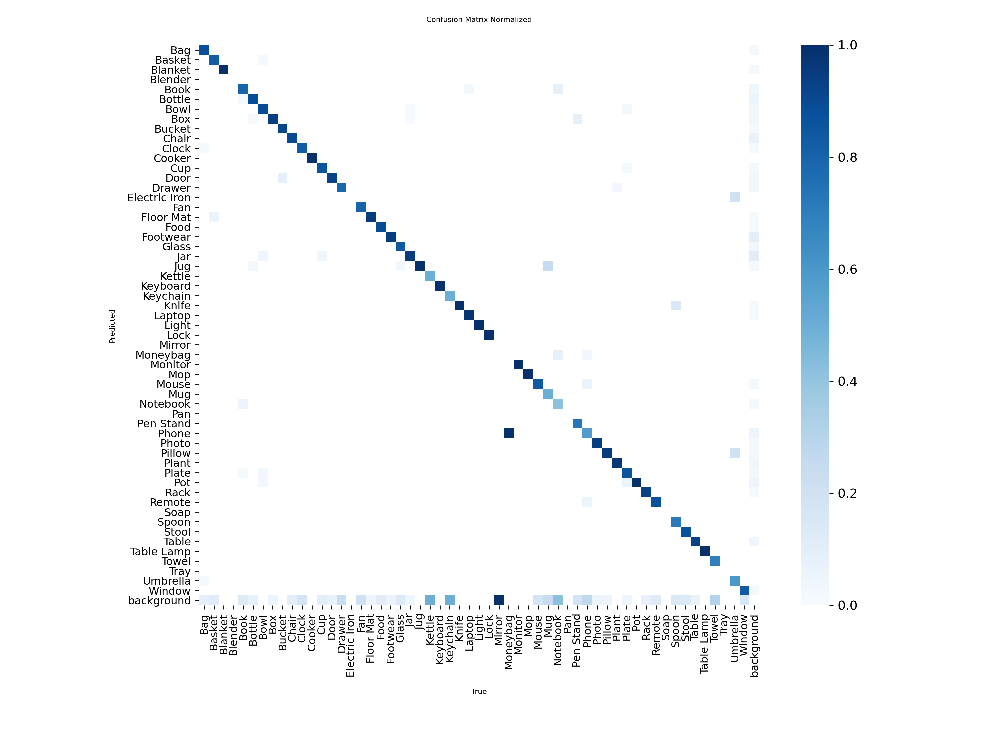

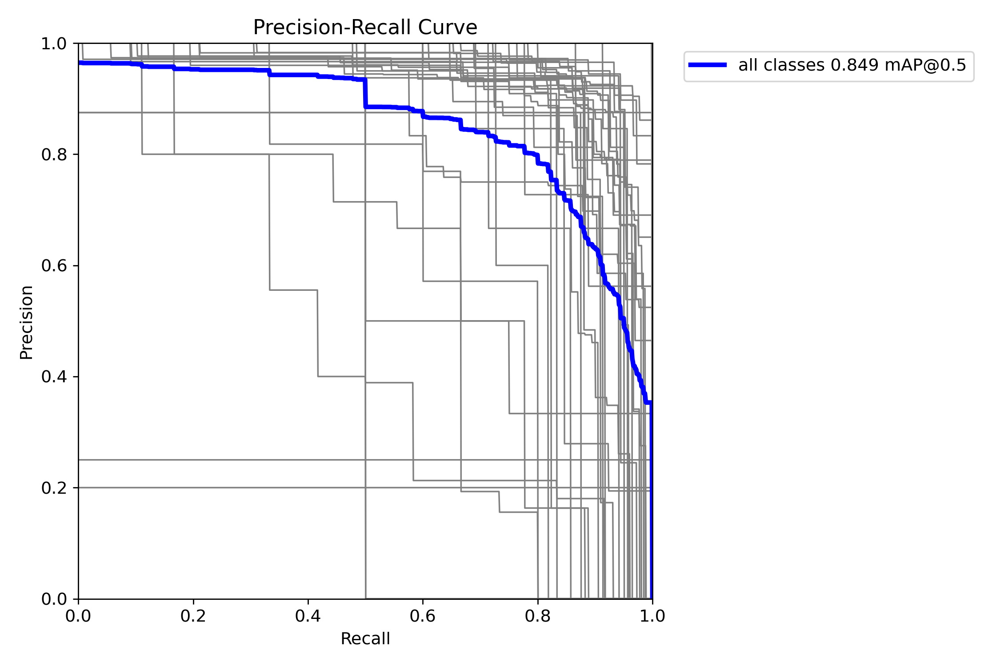

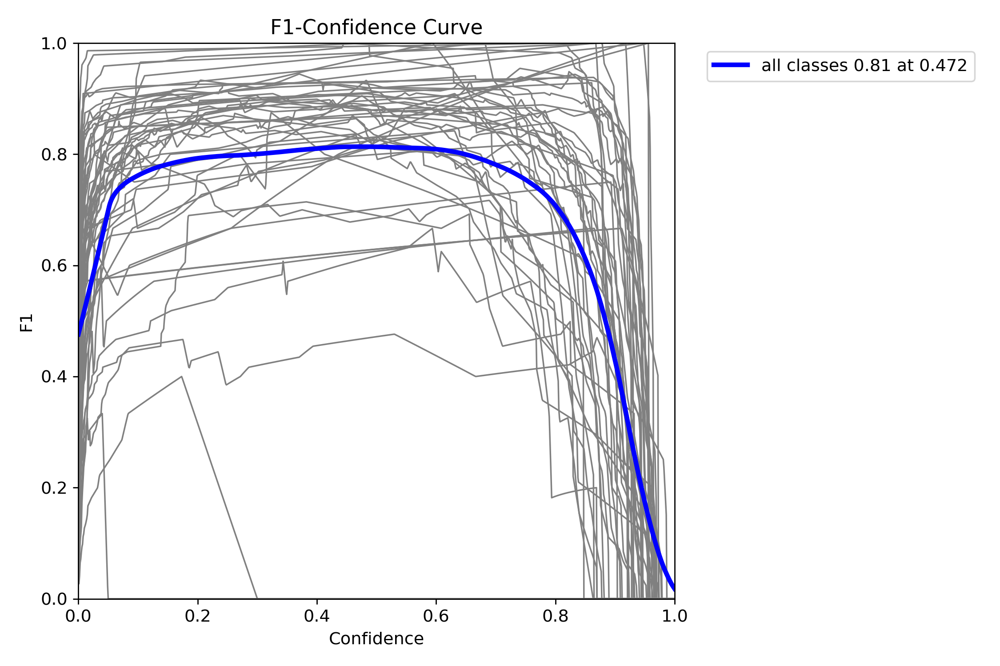

In [25]:
DET_PLOTS = ['confusion_matrix.png', 'confusion_matrix_normalized.png',
             'BoxPR_curve.png', 'PR_curve.png', 'BoxF1_curve.png', 'F1_curve.png']   # file names differ across Ultralytics versions

print(f"YOLO11s -- TEST split (from {yolo_test_metrics['save_dir']}):")
for fname in DET_PLOTS:
    fpath = os.path.join(yolo_test_metrics['save_dir'], fname)
    if os.path.exists(fpath):
        display(IPyImage(filename=fpath))

## 9. Detector Input / Output Gallery

Your single uploaded demo pair is reused in every gallery below: detector input → YOLO output → matching input/output → Random Forest input/output.

### 9a. Input: raw before / after pairs

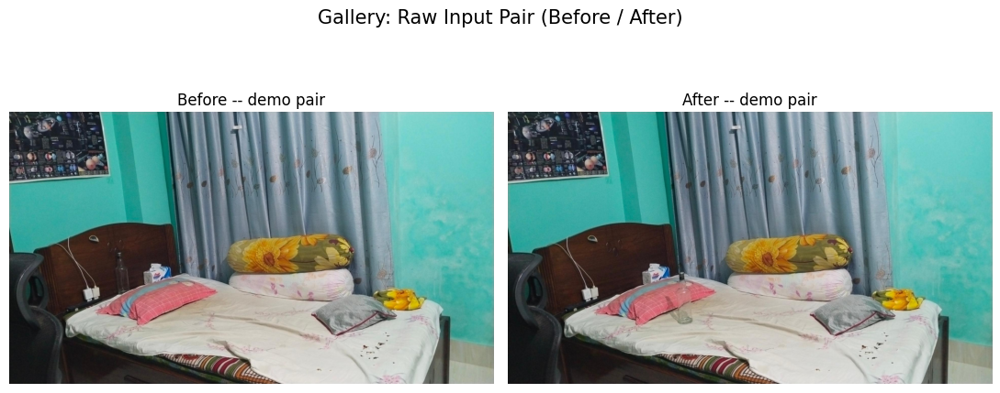

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(11, 4.6))
axes[0].imshow(demo_before_raw); axes[0].axis('off')
axes[0].set_title('Before -- demo pair', fontsize=12)
axes[1].imshow(demo_after_raw); axes[1].axis('off')
axes[1].set_title('After -- demo pair', fontsize=12)

plt.suptitle('Gallery: Raw Input Pair (Before / After)', fontsize=15, y=1.03)
plt.tight_layout()
plt.savefig('/content/gallery_1_raw_input.png', dpi=150, bbox_inches='tight')
plt.show()

### 9b. Output: YOLO detections (run on the CLAHE-preprocessed version of the same pairs)

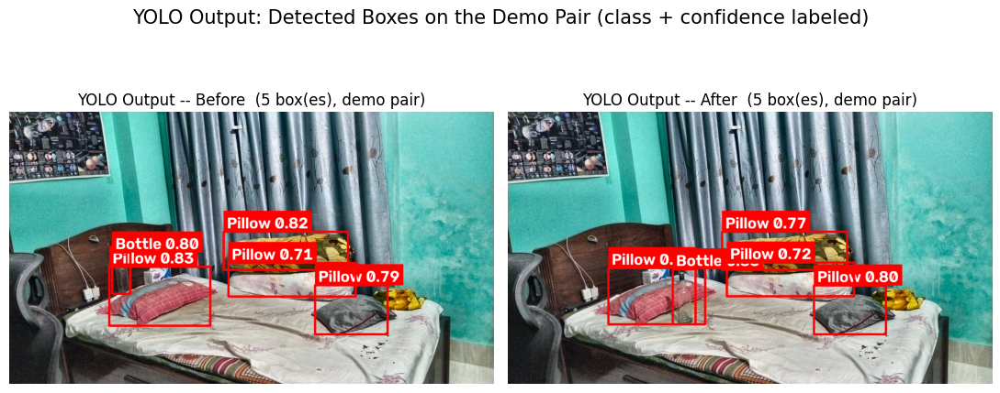

In [27]:
def draw_labeled_box(img, x1, y1, x2, y2, text, color, box_thickness=None):
    """Draw a bounding box plus a filled label chip behind the text, so the class
    name and confidence score stay clearly readable over any background. Box
    thickness, font size and padding all scale with the image resolution, so
    labels stay legible on both small crops and full-size phone-camera photos."""
    x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
    h, w = img.shape[:2]
    scale = max(h, w) / 1000.0

    if box_thickness is None:
        box_thickness = max(4, round(scale * 4))
    cv2.rectangle(img, (x1, y1), (x2, y2), color, box_thickness)

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = max(0.9, scale * 1.1)
    font_thickness = max(2, round(scale * 2.4))
    (tw, th), baseline = cv2.getTextSize(text, font, font_scale, font_thickness)
    pad = max(7, round(scale * 7))
    label_y1 = y1 - th - 2 * pad if y1 - th - 2 * pad > 0 else y1  # flip below box if no room above
    label_y2 = label_y1 + th + 2 * pad
    label_x2 = min(x1 + tw + 2 * pad, w - 1)
    cv2.rectangle(img, (x1, label_y1), (label_x2, label_y2), color, -1)
    text_color = (255, 255, 255) if sum(color) < 400 else (0, 0, 0)
    cv2.putText(img, text, (x1 + pad, label_y2 - pad), font, font_scale, text_color,
                font_thickness, cv2.LINE_AA)

yolo_model = YOLO(YOLO_WEIGHTS)

def _yolo_annotate_img(img_bgr, model, conf=0.4):
    """Run YOLO on an in-memory BGR image (the CLAHE-preprocessed demo pair) and return an annotated RGB copy."""
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    result = model(img_bgr, conf=conf, verbose=False)[0]
    annotated = img_rgb.copy()
    for box in result.boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        cls_name = model.names[int(box.cls[0])]
        conf_score = float(box.conf[0])
        draw_labeled_box(annotated, x1, y1, x2, y2, f'{cls_name} {conf_score:.2f}', (255, 0, 0))
    return annotated, len(result.boxes)

demo_before_annot, demo_n_before = _yolo_annotate_img(demo_before_pre, yolo_model)
demo_after_annot,  demo_n_after  = _yolo_annotate_img(demo_after_pre,  yolo_model)

fig, axes = plt.subplots(1, 2, figsize=(11, 4.6))
axes[0].imshow(demo_before_annot); axes[0].axis('off')
axes[0].set_title(f"YOLO Output -- Before  ({demo_n_before} box(es), demo pair)", fontsize=12)
axes[1].imshow(demo_after_annot); axes[1].axis('off')
axes[1].set_title(f"YOLO Output -- After  ({demo_n_after} box(es), demo pair)", fontsize=12)

plt.suptitle('YOLO Output: Detected Boxes on the Demo Pair (class + confidence labeled)',
             fontsize=15, y=1.03)
plt.tight_layout()
plt.savefig('/content/gallery_2_yolo_output.png', dpi=150, bbox_inches='tight')
plt.show()

## 10. Change-Detection Configuration & Functions

Order of use: camera-shift alignment → box matching (preliminary Add/Delete/Move candidates) → one feature row per pair.

In [28]:
# Final thresholds -- used to build the classifier's features and stored in the deployment config.
CONF_THRESH         = 0.4     # YOLO confidence threshold
MOVE_MIN_THRESH     = 15.0    # minimum displacement (px) that counts as a Move
MOVE_SAFETY_FACTOR  = 3.0     # move threshold = max(MOVE_MIN_THRESH, MOVE_SAFETY_FACTOR * camera-shift residual)
MAX_MATCH_DIST_FRAC = 0.35    # max centre distance for a match, as a fraction of the image diagonal
MIN_APPEARANCE_SIM  = 0.2     # min HSV-histogram correlation for two boxes to be the same object

In [29]:
def estimate_camera_shift(before_path, after_path, max_features=2000, good_match_pct=0.2,
                           ransac_reproj_thresh=5.0):
    """Input: before/after image paths. Output: (3x3 homography H mapping before -> after pixel coords, median RANSAC re-projection residual in px). Falls back to (identity, 0.0) if too few matches."""
    img1 = cv2.imread(before_path, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(after_path, cv2.IMREAD_GRAYSCALE)
    if img1 is None or img2 is None:
        return np.eye(3), 0.0

    orb = cv2.ORB_create(max_features)
    kp1, des1 = orb.detectAndCompute(img1, None)
    kp2, des2 = orb.detectAndCompute(img2, None)
    if des1 is None or des2 is None or len(kp1) < 10 or len(kp2) < 10:
        return np.eye(3), 0.0

    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
    matches = matcher.match(des1, des2)
    matches = sorted(matches, key=lambda m: m.distance)
    n_good = max(15, int(len(matches) * good_match_pct))
    matches = matches[:n_good]
    if len(matches) < 8:
        return np.eye(3), 0.0

    pts1 = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    pts2 = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    H, inlier_mask = cv2.findHomography(pts1, pts2, cv2.RANSAC, ransacReprojThreshold=ransac_reproj_thresh)
    if H is None:
        return np.eye(3), 0.0

    inliers = inlier_mask.ravel().astype(bool)
    if inliers.sum() < 8:
        return np.eye(3), 0.0

    pts1_proj = cv2.perspectiveTransform(pts1[inliers], H)
    residuals = np.linalg.norm((pts1_proj - pts2[inliers]).reshape(-1, 2), axis=1)
    residual_px = float(np.median(residuals))

    return H, residual_px

def adaptive_move_thresh(residual_px, min_thresh=15.0, safety_factor=3.0):
    """Displacement (px) above which a matched box counts as moved."""
    return max(min_thresh, safety_factor * residual_px)

In [30]:
def compute_iou(box1, box2):
    """IoU of two [x1, y1, x2, y2] boxes."""
    x1, y1, x2, y2 = box1
    x3, y3, x4, y4 = box2
    xi1, yi1 = max(x1, x3), max(y1, y3)
    xi2, yi2 = min(x2, x4), min(y2, y4)
    inter = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    area1 = (x2 - x1) * (y2 - y1)
    area2 = (x4 - x3) * (y4 - y3)
    union = area1 + area2 - inter
    return inter / union if union > 0 else 0.0

def extract_boxes(results, model):
    """Ultralytics results list -> [{"class", "bbox" [x1,y1,x2,y2], "confidence"}]."""
    boxes = []
    if results[0].boxes is not None:
        for box in results[0].boxes:
            xyxy = box.xyxy[0].cpu().numpy().tolist()
            cls_id = int(box.cls[0].cpu().numpy())
            boxes.append({
                'class': model.names[cls_id],
                'bbox': xyxy,
                'confidence': float(box.conf[0].cpu().numpy())
            })
    return boxes

def normalize_name(s):
    """Lower-case a class/object name and replace - and _ with spaces (for comparing names)."""
    return s.replace('-', ' ').replace('_', ' ').strip().lower()

def warp_bbox(bbox, H):
    """Map a box through homography H (before -> after); returns the axis-aligned box of the warped corners."""
    if H is None:
        return bbox
    x1, y1, x2, y2 = bbox
    corners = np.array([[[x1, y1]], [[x2, y1]], [[x2, y2]], [[x1, y2]]], dtype=np.float32)
    warped = cv2.perspectiveTransform(corners, H).reshape(-1, 2)
    wx1, wy1 = float(warped[:, 0].min()), float(warped[:, 1].min())
    wx2, wy2 = float(warped[:, 0].max()), float(warped[:, 1].max())
    return [wx1, wy1, wx2, wy2]

def get_image_size(path):
    """Image (width, height) without decoding pixels."""
    with PILImage.open(path) as im:
        return im.size

def crop_bbox(img, bbox, pad=4):
    """Crop img to bbox (+pad px, clipped to the image); None if the crop is empty."""
    if img is None:
        return None
    h, w = img.shape[:2]
    x1, y1, x2, y2 = [int(round(v)) for v in bbox]
    x1, y1 = max(0, x1 - pad), max(0, y1 - pad)
    x2, y2 = min(w, x2 + pad), min(h, y2 + pad)
    if x2 <= x1 or y2 <= y1:
        return None
    return img[y1:y2, x1:x2]

def appearance_similarity(crop_a, crop_b):
    """HSV-histogram correlation of two crops in [0, 1]."""
    if crop_a is None or crop_b is None or crop_a.size == 0 or crop_b.size == 0:
        return 0.0
    hsv_a = cv2.cvtColor(crop_a, cv2.COLOR_BGR2HSV)
    hsv_b = cv2.cvtColor(crop_b, cv2.COLOR_BGR2HSV)
    hist_a = cv2.calcHist([hsv_a], [0, 1], None, [50, 60], [0, 180, 0, 256])
    hist_b = cv2.calcHist([hsv_b], [0, 1], None, [50, 60], [0, 180, 0, 256])
    cv2.normalize(hist_a, hist_a)
    cv2.normalize(hist_b, hist_b)
    corr = cv2.compareHist(hist_a, hist_b, cv2.HISTCMP_CORREL)
    return float(max(0.0, corr))

def match_boxes(before_boxes, after_boxes, H=None, move_thresh=50,
                 image_diag=None, max_match_dist_frac=0.35,
                 before_img=None, after_img=None, min_appearance_sim=0.35):
    """Input: YOLO box lists for before/after, homography H, thresholds, and the two images (used only for the appearance check). Output: (events, matched_pairs). Boxes are matched per class with the Hungarian algorithm; unmatched before-boxes -> Delete, unmatched after-boxes -> Add, matched boxes moved beyond move_thresh -> Move. Event types are PRELIMINARY candidates, not the final label."""
    events = []
    matched_pairs = []
    max_match_dist = (max_match_dist_frac * image_diag) if image_diag else float('inf')
    use_appearance = before_img is not None and after_img is not None

    classes = set(b['class'] for b in before_boxes) | set(a['class'] for a in after_boxes)

    for cls in classes:
        b_idx = [i for i, b in enumerate(before_boxes) if b['class'] == cls]
        a_idx = [j for j, a in enumerate(after_boxes) if a['class'] == cls]
        if not b_idx and not a_idx:
            continue

        b_centers = []
        for i in b_idx:
            wb = warp_bbox(before_boxes[i]['bbox'], H)
            b_centers.append(((wb[0] + wb[2]) / 2, (wb[1] + wb[3]) / 2))
        a_centers = []
        for j in a_idx:
            ab = after_boxes[j]['bbox']
            a_centers.append(((ab[0] + ab[2]) / 2, (ab[1] + ab[3]) / 2))

        matched_b, matched_a = set(), set()

        if b_idx and a_idx:
            cost = np.zeros((len(b_idx), len(a_idx)))
            for bi, (bx, by) in enumerate(b_centers):
                for aj, (ax, ay) in enumerate(a_centers):
                    cost[bi, aj] = np.hypot(ax - bx, ay - by)
            row_ind, col_ind = linear_sum_assignment(cost)

            for bi, aj in zip(row_ind, col_ind):
                dist = float(cost[bi, aj])
                if dist > max_match_dist:
                    continue

                i, j = b_idx[bi], a_idx[aj]
                b, a = before_boxes[i], after_boxes[j]

                sim = 1.0
                if use_appearance:
                    crop_b_img = crop_bbox(before_img, b['bbox'])
                    crop_a_img = crop_bbox(after_img, a['bbox'])
                    sim = appearance_similarity(crop_b_img, crop_a_img)
                    if sim < min_appearance_sim:

                        continue

                matched_b.add(bi)
                matched_a.add(aj)
                matched_pairs.append((b, a, dist, sim))
                if dist > move_thresh:
                    events.append({'type': 'Move', 'candidate_type': 'Move', 'object': cls,
                                    'confidence': (b['confidence'] + a['confidence']) / 2,
                                    'movement': dist, 'appearance_sim': sim})

        for bi, i in enumerate(b_idx):
            if bi not in matched_b:
                events.append({'type': 'Delete', 'candidate_type': 'Delete', 'object': cls,
                                'confidence': before_boxes[i]['confidence'], 'movement': 0.0})
        for aj, j in enumerate(a_idx):
            if aj not in matched_a:
                events.append({'type': 'Add', 'candidate_type': 'Add', 'object': cls,
                                'confidence': after_boxes[j]['confidence'], 'movement': 0.0})

    # NOTE: event['type'] is a PRELIMINARY candidate type produced by geometric/appearance rules.
    # The Random Forest later makes the final pair-level change-type prediction.
    return events, matched_pairs

def summarize_events(events, matched_pairs=None):
    """Aggregate events/matches into counts, best confidences and distances."""
    matched_pairs = matched_pairs or []
    add_events = [e for e in events if e['type'] == 'Add']
    del_events = [e for e in events if e['type'] == 'Delete']
    move_events = [e for e in events if e['type'] == 'Move']

    def best(evs):
        return max(evs, key=lambda e: e['confidence']) if evs else None

    best_add, best_del, best_move = best(add_events), best(del_events), best(move_events)
    max_matched_dist = max((d for _, _, d, _ in matched_pairs), default=0.0)
    avg_appearance_sim = float(np.mean([s for _, _, _, s in matched_pairs])) if matched_pairs else 0.0

    return {
        'n_add': len(add_events), 'n_del': len(del_events), 'n_move': len(move_events),
        'net': len(add_events) - len(del_events),
        'best_add_conf': best_add['confidence'] if best_add else 0.0,
        'best_del_conf': best_del['confidence'] if best_del else 0.0,
        'best_move_conf': best_move['confidence'] if best_move else 0.0,
        'best_move_dist': best_move['movement'] if best_move else 0.0,
        'max_matched_dist': max_matched_dist,
        'avg_appearance_sim': avg_appearance_sim,
        'best_add': best_add, 'best_del': best_del, 'best_move': best_move,
    }

def object_for_type(predicted_type, stats, matched_pairs):
    """Object name for the change type predicted by the classifier, taken from the matching events."""
    key = {'Add': 'best_add', 'Delete': 'best_del', 'Move': 'best_move'}.get(predicted_type)
    cand = stats.get(key) if key else None
    if cand:
        return cand['object']
    if matched_pairs:
        b, a, dist, sim = max(matched_pairs, key=lambda t: t[2])
        return b['class']
    return 'Unknown'

def build_feature_dict(before_boxes, after_boxes, ious, residual_px, move_thresh, events, matched_pairs):
    """One numeric feature row per before/after pair (the Random Forest input). Returns (feature dict, event stats)."""
    stats = summarize_events(events, matched_pairs)
    best_move = stats['best_move']
    best_move_appearance_sim = best_move['appearance_sim'] if best_move else 0.0

    n_matched = len(matched_pairs)
    frac_matched_before = n_matched / len(before_boxes) if before_boxes else 0.0
    frac_matched_after = n_matched / len(after_boxes) if after_boxes else 0.0

    n_classes_changed = len({e['object'] for e in events})

    add_del_conf_margin = stats['best_add_conf'] - stats['best_del_conf']
    move_conf_margin = stats['best_move_conf'] - max(stats['best_add_conf'], stats['best_del_conf'])

    area_ratios = []
    for b, a, dist, sim in matched_pairs:
        ab, aa = b['bbox'], a['bbox']
        area_b = max(1e-6, (ab[2] - ab[0]) * (ab[3] - ab[1]))
        area_a = max(1e-6, (aa[2] - aa[0]) * (aa[3] - aa[1]))
        area_ratios.append(min(area_a, area_b) / max(area_a, area_b))
    avg_matched_area_ratio = float(np.mean(area_ratios)) if area_ratios else 1.0

    net_count_diff = len(after_boxes) - len(before_boxes)
    total_events = stats['n_add'] + stats['n_del'] + stats['n_move']
    move_event_ratio = (stats['n_move'] / total_events) if total_events else 0.0
    is_net_ambiguous = 1.0 if abs(net_count_diff) <= 1 else 0.0

    feat = {
        'before_count': len(before_boxes), 'after_count': len(after_boxes),
        'net_count_diff': net_count_diff,
        'total_objects': len(before_boxes) + len(after_boxes),
        'max_iou': max(ious) if ious else 0.0, 'avg_iou': float(np.mean(ious)) if ious else 0.0,
        'camera_shift_residual_px': residual_px, 'move_thresh_used': move_thresh,
        'n_add': stats['n_add'], 'n_del': stats['n_del'], 'n_move': stats['n_move'],
        'best_add_conf': stats['best_add_conf'], 'best_del_conf': stats['best_del_conf'],
        'best_move_conf': stats['best_move_conf'], 'best_move_dist': stats['best_move_dist'],
        'max_matched_dist': stats['max_matched_dist'], 'avg_appearance_sim': stats['avg_appearance_sim'],
        'best_move_appearance_sim': best_move_appearance_sim,
        'n_matched': n_matched, 'frac_matched_before': frac_matched_before,
        'frac_matched_after': frac_matched_after,
        'add_del_conf_margin': add_del_conf_margin, 'move_conf_margin': move_conf_margin,
        'n_classes_changed': n_classes_changed, 'avg_matched_area_ratio': avg_matched_area_ratio,
        'total_events': total_events, 'move_event_ratio': move_event_ratio,
        'is_net_ambiguous': is_net_ambiguous,
    }
    return feat, stats

def build_results_df(cache, max_match_dist_frac, min_appearance_sim, move_min_thresh, move_safety_factor):
    """Run matching + feature extraction for every cached pair.
    Returns (results_df: one feature row + labels per pair, contexts: stats / matched_pairs / events per pair)."""
    rows, contexts = [], []
    for c in cache:
        move_thresh = adaptive_move_thresh(c['residual_px'], move_min_thresh, move_safety_factor)
        before_img = cv2.imread(c['before_path'])
        after_img  = cv2.imread(c['after_path'])

        events, matched_pairs = match_boxes(
            c['before_boxes'], c['after_boxes'], H=c['H'], move_thresh=move_thresh,
            image_diag=c['image_diag'], max_match_dist_frac=max_match_dist_frac,
            before_img=before_img, after_img=after_img, min_appearance_sim=min_appearance_sim)

        ious = [compute_iou(warp_bbox(b['bbox'], c['H']), a['bbox'])
                for b, a, dist, sim in matched_pairs]

        feat, stats = build_feature_dict(c['before_boxes'], c['after_boxes'], ious,
                                         c['residual_px'], move_thresh, events, matched_pairs)
        rows.append({
            'pair_id': c['pair_id'], **feat,
            'true_change': c['true_change'], 'true_object': c['true_object'], 'room': c['room'],
            'split': c['split'],
        })
        contexts.append({'stats': stats, 'matched_pairs': matched_pairs, 'events': events})
    return pd.DataFrame(rows), contexts

## 11. Detect Objects & Build the Feature Table

In [31]:
CHANGE_LABEL_MAP = {'add': 'Add', 'delete': 'Delete', 'move': 'Move'}

pairs_df = ALL_PAIRS_DF.copy()
pairs_df['true_change'] = pairs_df['change_type'].map(CHANGE_LABEL_MAP)
assert pairs_df['true_change'].notna().all(), "Unexpected change_type in ALL_PAIRS_DF"
pairs_df = pairs_df.rename(columns={'object': 'true_object'})

print(f"{len(pairs_df)} labeled before/after pairs")
pairs_df[['pair_id', 'before_path', 'after_path', 'true_change', 'true_object', 'room', 'split']].head()

915 labeled before/after pairs


,pair_id,before_path,after_path,true_change,true_object,room,split
0,0059,/content/custom_data/images/2107038_2c97fbb7-0...,/content/custom_data/images/2107038_c52b77ff-0...,Add,bag,bedroom,train
1,0060,/content/custom_data/images/2107038_be1debbe-0...,/content/custom_data/images/2107038_ae547178-0...,Move,bag,bedroom,validation
2,0061,/content/custom_data/images/2107038_438a97d3-0...,/content/custom_data/images/2107038_aa8dcf7e-0...,Delete,bag,bedroom,validation
3,0062,/content/custom_data/images/2107038_15b92529-0...,/content/custom_data/images/2107038_942d0f68-0...,Add,chair,bedroom,validation
4,0063,/content/custom_data/images/2107038_70e45993-0...,/content/custom_data/images/2107038_34b3a240-0...,Move,chair,bedroom,train


In [32]:
detection_cache = []
for _, row in pairs_df.iterrows():
    before_boxes = extract_boxes(yolo_model(row['before_path'], conf=CONF_THRESH, verbose=False), yolo_model)
    after_boxes  = extract_boxes(yolo_model(row['after_path'],  conf=CONF_THRESH, verbose=False), yolo_model)

    H, residual_px = estimate_camera_shift(row['before_path'], row['after_path'])
    after_w, after_h = get_image_size(row['after_path'])

    detection_cache.append({
        'pair_id': row['pair_id'], 'before_boxes': before_boxes, 'after_boxes': after_boxes,
        'H': H, 'residual_px': residual_px, 'image_diag': float(np.hypot(after_w, after_h)),
        'before_path': row['before_path'], 'after_path': row['after_path'],
        'true_change': row['true_change'], 'true_object': row['true_object'], 'room': row['room'],
        'split': row['split'],
    })

results_df, pair_contexts = build_results_df(
    detection_cache, MAX_MATCH_DIST_FRAC, MIN_APPEARANCE_SIM, MOVE_MIN_THRESH, MOVE_SAFETY_FACTOR)

print(f"Detections, camera-shift alignment and features ready for {len(results_df)} pairs.")
results_df.head()

# ---- Same detection + matching + feature pipeline, run once for the single demo pair ----
# (this is the pair reused by every gallery/section below, instead of looping over several pairs)
demo_before_boxes = extract_boxes(yolo_model(demo_before_pre, conf=CONF_THRESH, verbose=False), yolo_model)
demo_after_boxes  = extract_boxes(yolo_model(demo_after_pre,  conf=CONF_THRESH, verbose=False), yolo_model)

demo_H, demo_residual_px = estimate_camera_shift(DEMO_BEFORE_PRE_PATH, DEMO_AFTER_PRE_PATH)
demo_after_h, demo_after_w = demo_after_pre.shape[:2]
demo_image_diag = float(np.hypot(demo_after_w, demo_after_h))
demo_move_thresh = adaptive_move_thresh(demo_residual_px, MOVE_MIN_THRESH, MOVE_SAFETY_FACTOR)

demo_events, demo_matched_pairs = match_boxes(
    demo_before_boxes, demo_after_boxes, H=demo_H, move_thresh=demo_move_thresh,
    image_diag=demo_image_diag, max_match_dist_frac=MAX_MATCH_DIST_FRAC,
    before_img=demo_before_pre, after_img=demo_after_pre, min_appearance_sim=MIN_APPEARANCE_SIM)

demo_ious = [compute_iou(warp_bbox(b['bbox'], demo_H), a['bbox']) for b, a, dist, sim in demo_matched_pairs]
demo_feat, demo_stats = build_feature_dict(demo_before_boxes, demo_after_boxes, demo_ious,
                                            demo_residual_px, demo_move_thresh, demo_events, demo_matched_pairs)
demo_feat_row = pd.DataFrame([demo_feat])
demo_ctx = {'stats': demo_stats, 'matched_pairs': demo_matched_pairs, 'events': demo_events}

print(f"Demo pair: {len(demo_before_boxes)} before box(es), {len(demo_after_boxes)} after box(es), "
      f"{len(demo_matched_pairs)} matched, {len(demo_events)} event(s).")

Detections, camera-shift alignment and features ready for 915 pairs.
Demo pair: 5 before box(es), 5 after box(es), 5 matched, 1 event(s).


## 12. Matching Algorithm — Input and Output

**Input:** YOLO boxes (class, bbox, confidence) for before and after, the homography `H` (before → after), the thresholds, and the two images (only used to crop boxes for the appearance check).
**Output:** `matched_pairs` and `events` — preliminary Add / Delete / Move candidates that localise the changed object. They are evidence for the features, not the final label.

In [33]:
pos_by_pair_id = {c['pair_id']: i for i, c in enumerate(detection_cache)}

def move_thresh_for(c):
    """Adaptive move threshold (px) for one cached pair."""
    return adaptive_move_thresh(c['residual_px'], MOVE_MIN_THRESH, MOVE_SAFETY_FACTOR)

def boxes_df(boxes):
    """YOLO box list -> table."""
    return pd.DataFrame(
        [{'class': b['class'], 'x1': round(b['bbox'][0]), 'y1': round(b['bbox'][1]),
          'x2': round(b['bbox'][2]), 'y2': round(b['bbox'][3]),
          'confidence': round(b['confidence'], 3)} for b in boxes],
        columns=['class', 'x1', 'y1', 'x2', 'y2', 'confidence'])

def matching_output_tables(ctx, move_thresh):
    """Matching result of one pair -> (matched_pairs table, candidate events table)."""
    matched_df = pd.DataFrame(
        [{'class': b['class'],
          'before_bbox': [round(v) for v in b['bbox']],
          'after_bbox': [round(v) for v in a['bbox']],
          'moved_px': round(dist, 1),
          'appearance_sim': round(sim, 2),
          'role': 'Move' if dist > move_thresh else 'unchanged'}
         for b, a, dist, sim in ctx['matched_pairs']],
        columns=['class', 'before_bbox', 'after_bbox', 'moved_px', 'appearance_sim', 'role'])
    events_df = pd.DataFrame(
        [{'candidate_type': e['candidate_type'], 'object': e['object'],
          'confidence': round(e['confidence'], 3), 'movement_px': round(e['movement'], 1)}
         for e in ctx['events']],
        columns=['candidate_type', 'object', 'confidence', 'movement_px'])
    return matched_df, events_df

def annotate_side(img_bgr, boxes, matched_ids, move_ids, side):
    """Draw one image of a pair: unchanged matched boxes thin grey, moved boxes orange,
    unmatched boxes red 'Delete' (before image) or green 'Add' (after image)."""
    out = img_bgr.copy()
    for b in boxes:
        x1, y1, x2, y2 = b['bbox']
        if id(b) in move_ids:
            draw_labeled_box(out, x1, y1, x2, y2, f"{b['class']} - Move", (0, 140, 255))
        elif id(b) in matched_ids:
            draw_labeled_box(out, x1, y1, x2, y2, b['class'], (160, 160, 160), box_thickness=2)
        elif side == 'before':
            draw_labeled_box(out, x1, y1, x2, y2, f"{b['class']} - Delete", (0, 0, 255))
        else:
            draw_labeled_box(out, x1, y1, x2, y2, f"{b['class']} - Add", (0, 180, 0))
    return out

### 12a. Matching input

In [34]:
print("--- Matching input: your demo pair ---")
print(f"before_boxes ({len(demo_before_boxes)}):")
display(boxes_df(demo_before_boxes))
print(f"after_boxes ({len(demo_after_boxes)}):")
display(boxes_df(demo_after_boxes))
print("H (before -> after):")
print(np.array2string(demo_H, precision=4, suppress_small=True))
print(f"camera_shift_residual = {demo_residual_px:.2f}px  |  move_thresh = {demo_move_thresh:.1f}px  |  "
      f"image_diag = {demo_image_diag:.1f}px")
print(f"max_match_dist_frac = {MAX_MATCH_DIST_FRAC}  |  min_appearance_sim = {MIN_APPEARANCE_SIM}")
print(f"before_img = pixel array {demo_before_pre.shape}  |  after_img = pixel array {demo_after_pre.shape}")

--- Matching input: your demo pair ---
before_boxes (5):


,class,x1,y1,x2,y2,confidence
0,Pillow,396,616,797,850,0.834
1,Pillow,849,476,1342,627,0.816
2,Bottle,408,558,480,723,0.798
3,Pillow,1211,689,1499,883,0.787
4,Pillow,869,600,1372,733,0.711


after_boxes (5):


,class,x1,y1,x2,y2,confidence
0,Pillow,399,621,781,844,0.829
1,Bottle,654,625,743,843,0.829
2,Pillow,1212,689,1498,883,0.804
3,Pillow,848,476,1343,628,0.772
4,Pillow,867,599,1372,733,0.720


H (before -> after):
[[          1  1.9227e-17  2.8909e-16]
 [-4.5811e-17           1  2.3131e-14]
 [-1.2444e-19  7.9142e-20           1]]
camera_shift_residual = 0.00px  |  move_thresh = 15.0px  |  image_diag = 2202.9px
max_match_dist_frac = 0.35  |  min_appearance_sim = 0.2
before_img = pixel array (1080, 1920, 3)  |  after_img = pixel array (1080, 1920, 3)


### 12b. Matching output

In [35]:
matched_df, events_df = matching_output_tables(demo_ctx, demo_move_thresh)
print(f"--- Matching output: your demo pair  (move_thresh = {demo_move_thresh:.1f}px) ---")
print(f"matched_pairs ({len(matched_df)}):")
display(matched_df)
print(f"events ({len(events_df)}), preliminary Add / Delete / Move candidates:")
display(events_df)

--- Matching output: your demo pair  (move_thresh = 15.0px) ---
matched_pairs (5):


,class,before_bbox,after_bbox,moved_px,appearance_sim,role
0,Pillow,"[396, 616, 797, 850]","[399, 621, 781, 844]",6.5,0.91,unchanged
1,Pillow,"[849, 476, 1342, 627]","[848, 476, 1343, 628]",0.3,1.00,unchanged
2,Pillow,"[1211, 689, 1499, 883]","[1212, 689, 1498, 883]",0.4,0.84,unchanged
3,Pillow,"[869, 600, 1372, 733]","[867, 599, 1372, 733]",1.5,0.98,unchanged
4,Bottle,"[408, 558, 480, 723]","[654, 625, 743, 843]",271.5,0.36,Move


events (1), preliminary Add / Delete / Move candidates:


,candidate_type,object,confidence,movement_px
0,Move,Bottle,0.814,271.5


## 13. Random Forest — Training, Input and Output

**Input:** one numeric feature row per before/after pair. **Output:** the pair-level change type (Add / Delete / Move) with class probabilities. The Random Forest never sees boxes or images; the object name is looked up from the matching events (`object_for_type`) after the change type is predicted.

### 13a. Train and evaluate

In [36]:
FEATURE_COLS = [
    'net_count_diff', 'max_iou', 'avg_iou', 'camera_shift_residual_px', 'move_thresh_used',
    'n_add', 'n_del', 'n_move',
    'best_add_conf', 'best_del_conf', 'best_move_conf', 'best_move_dist',
    'max_matched_dist', 'avg_appearance_sim', 'best_move_appearance_sim',
    'n_matched', 'frac_matched_before', 'frac_matched_after',
    'add_del_conf_margin', 'move_conf_margin', 'n_classes_changed', 'avg_matched_area_ratio',
    'total_events', 'move_event_ratio', 'is_net_ambiguous',
]
MODEL_NAME = 'Random Forest'

# Shallow, heavily regularised trees to limit overfitting on ~640 training pairs.
rf_template = RandomForestClassifier(
    n_estimators=200, max_depth=3, min_samples_leaf=10, min_samples_split=15,
    max_features=0.5, max_samples=0.8, ccp_alpha=0.01,
    class_weight='balanced', bootstrap=True, random_state=42)

def features(df):
    return df[FEATURE_COLS].fillna(0.0)

train_df = results_df[results_df['split'] == 'train']
val_df   = results_df[results_df['split'] == 'validation']
test_df  = results_df[results_df['split'] == 'test']
X_train, y_train = features(train_df), train_df['true_change']
X_val,   y_val   = features(val_df),   val_df['true_change']
X_test,  y_test  = features(test_df),  test_df['true_change']
print(f"Train: {len(train_df)}   Validation: {len(val_df)}   Test: {len(test_df)}")

# 1) fit on train, score on validation
rf_train = clone(rf_template).fit(X_train, y_train)
train_f1 = f1_score(y_train, rf_train.predict(X_train), average='macro')
val_f1   = f1_score(y_val,   rf_train.predict(X_val),   average='macro')

# 2) fit on train + validation, score on TEST once
rf_trainval = clone(rf_template).fit(pd.concat([X_train, X_val]), pd.concat([y_train, y_val]))
test_pred = rf_trainval.predict(X_test)
test_report = classification_report(y_test, test_pred, output_dict=True)

print(f"\n{MODEL_NAME} -- TEST split (n={len(y_test)})")
print(classification_report(y_test, test_pred))
print(f"Macro-F1: train {train_f1:.3f}  |  validation {val_f1:.3f}  |  test {test_report['macro avg']['f1-score']:.3f}")

# Predicted change type for every pair (train/validation rows are optimistic; only TEST is a fair check).
results_df['predicted_change'] = rf_trainval.predict(features(results_df))
results_df['predicted_object'] = [
    object_for_type(pred, ctx['stats'], ctx['matched_pairs'])
    for pred, ctx in zip(results_df['predicted_change'], pair_contexts)]

# 3) deployment model: refit on all labeled pairs
rf_final = clone(rf_template).fit(features(results_df), results_df['true_change'])
importances = pd.Series(rf_final.feature_importances_, index=FEATURE_COLS).sort_values(ascending=False)
print("\nTop feature importances (deployment model):")
print(importances.head(10).round(3))

Train: 640   Validation: 137   Test: 138

Random Forest -- TEST split (n=138)
              precision    recall  f1-score   support

         Add       0.87      0.82      0.85        50
      Delete       0.75      0.63      0.68        43
        Move       0.58      0.71      0.64        45

    accuracy                           0.72       138
   macro avg       0.73      0.72      0.72       138
weighted avg       0.74      0.72      0.73       138

Macro-F1: train 0.813  |  validation 0.718  |  test 0.723

Top feature importances (deployment model):
add_del_conf_margin    0.477
max_matched_dist       0.178
net_count_diff         0.110
best_move_dist         0.071
best_add_conf          0.046
best_del_conf          0.033
move_conf_margin       0.030
frac_matched_after     0.015
frac_matched_before    0.010
avg_iou                0.010
dtype: float64


### 13a-i. Visualize one full tree (for reports/figures)


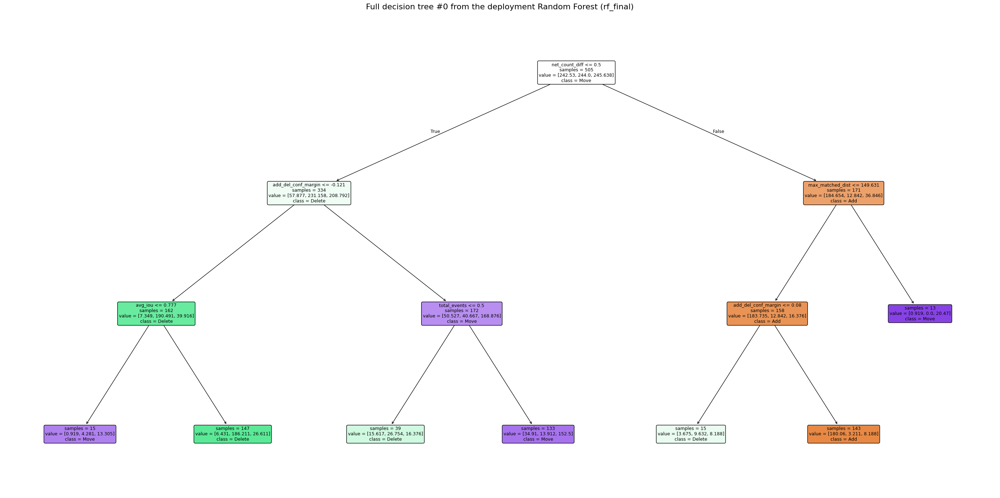

Tree #0  |  depth = 3  |  leaves = 7


In [37]:
from sklearn.tree import plot_tree

TREE_INDEX = 0  # which of the 200 trees in rf_final to draw (0-199)
tree_to_plot = rf_final.estimators_[TREE_INDEX]

fig, ax = plt.subplots(figsize=(28, 14))
plot_tree(
    tree_to_plot,
    feature_names=FEATURE_COLS,
    class_names=list(rf_final.classes_),
    filled=True, rounded=True, impurity=False, fontsize=9, ax=ax,
)
plt.title(f"Full decision tree #{TREE_INDEX} from the deployment Random Forest (rf_final)", fontsize=16)
plt.tight_layout()
plt.savefig('/content/rf_full_tree.png', dpi=200, bbox_inches='tight')
plt.show()

print(f"Tree #{TREE_INDEX}  |  depth = {tree_to_plot.get_depth()}  |  leaves = {tree_to_plot.get_n_leaves()}")


### 13b. Random Forest input (feature row of the demo pair)

In [38]:
X_demo = features(demo_feat_row)
display(X_demo)

,net_count_diff,max_iou,avg_iou,camera_shift_residual_px,move_thresh_used,n_add,n_del,n_move,best_add_conf,best_del_conf,...,n_matched,frac_matched_before,frac_matched_after,add_del_conf_margin,move_conf_margin,n_classes_changed,avg_matched_area_ratio,total_events,move_event_ratio,is_net_ambiguous
0,0,0.99003,0.773626,0.0,15.0,0,0,1,0.0,0.0,...,5,1.0,1.0,0.0,0.813777,1,0.897812,1,1.0,1.0


### 13c. Random Forest output (change type + probabilities)

In [39]:
demo_out = pd.DataFrame(
    rf_trainval.predict_proba(X_demo), columns=[f'P({c})' for c in rf_trainval.classes_])
demo_out.index = ['your demo pair']
demo_out['predicted_change'] = rf_trainval.predict(X_demo)
display(demo_out)

,P(Add),P(Delete),P(Move),predicted_change
your demo pair,0.041514,0.056782,0.901704,Move


## 14. Final Evaluation (TEST split)

### 14a. Confusion matrix

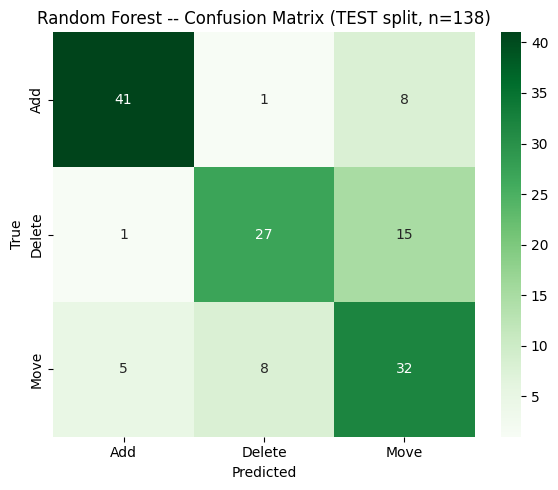

In [40]:
labels_sorted = sorted(set(y_test) | set(test_pred))
cm = confusion_matrix(y_test, test_pred, labels=labels_sorted)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', xticklabels=labels_sorted, yticklabels=labels_sorted)
plt.xlabel('Predicted'); plt.ylabel('True')
plt.title(f'{MODEL_NAME} -- Confusion Matrix (TEST split, n={len(y_test)})')
plt.tight_layout()
plt.savefig('/content/change_confusion_matrix_ml.png', dpi=150)
plt.show()

### 14b. Precision / recall / F1 per class

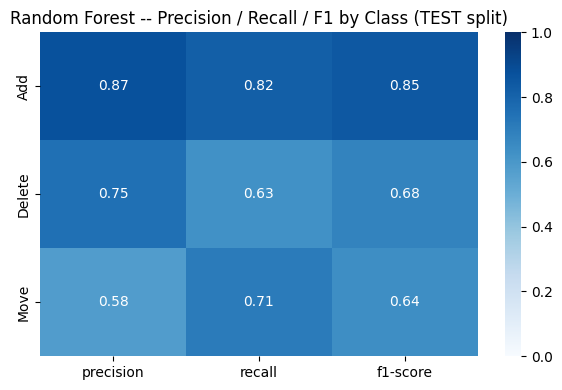

In [41]:
report_df = pd.DataFrame(test_report).transpose().loc[labels_sorted, ['precision', 'recall', 'f1-score']]

plt.figure(figsize=(6, 4))
sns.heatmap(report_df, annot=True, fmt='.2f', cmap='Blues', vmin=0, vmax=1)
plt.title(f'{MODEL_NAME} -- Precision / Recall / F1 by Class (TEST split)')
plt.tight_layout()
plt.savefig('/content/classification_report_heatmap.png', dpi=150)
plt.show()

### 14c. ROC curves (one-vs-rest)

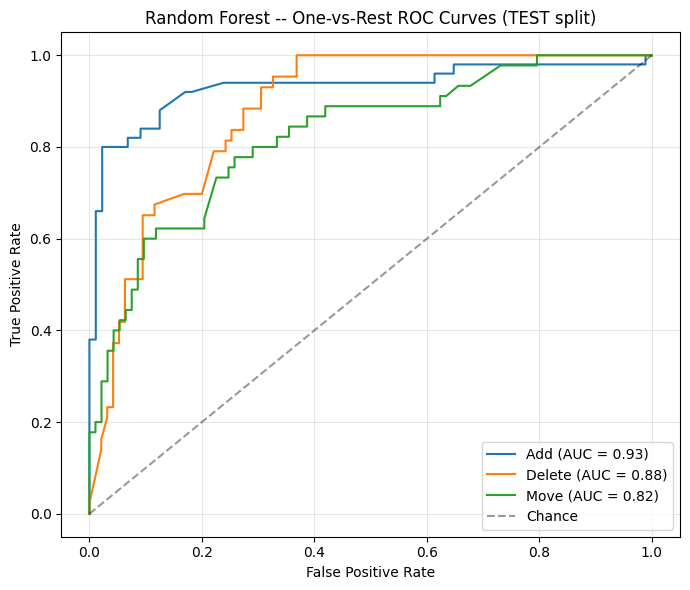

In [42]:
y_score = rf_trainval.predict_proba(X_test)

plt.figure(figsize=(7, 6))
for i, cls in enumerate(rf_trainval.classes_):
    y_true_bin = (y_test == cls).astype(int)
    if y_true_bin.sum() in (0, len(y_true_bin)):
        continue   # class absent (or the only class) in TEST -- ROC undefined
    fpr, tpr, _ = roc_curve(y_true_bin, y_score[:, i])
    plt.plot(fpr, tpr, label=f'{cls} (AUC = {auc(fpr, tpr):.2f})')
plt.plot([0, 1], [0, 1], 'k--', alpha=0.4, label='Chance')
plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
plt.title(f'{MODEL_NAME} -- One-vs-Rest ROC Curves (TEST split)')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('/content/classifier_roc_curves.png', dpi=150)
plt.show()

### 14d. Prediction distribution and errors

In [43]:
print("True change distribution by split:")
print(results_df.groupby('split')['true_change'].value_counts().unstack(fill_value=0))
print("\nPredicted change distribution by split (train/validation are optimistic; only TEST is a fair check):")
print(results_df.groupby('split')['predicted_change'].value_counts().unstack(fill_value=0))

True change distribution by split:
true_change  Add  Delete  Move
split                         
test          50      43    45
train        232     199   209
validation    50      43    44

Predicted change distribution by split (train/validation are optimistic; only TEST is a fair check):
predicted_change  Add  Delete  Move
split                              
test               47      36    55
train             198     177   265
validation         43      40    54


In [44]:
test_rows = results_df[results_df['split'] == 'test']
wrong = test_rows[test_rows['true_change'] != test_rows['predicted_change']]
print(f"{len(wrong)} / {len(test_rows)} TEST pairs misclassified")
wrong[['pair_id', 'true_change', 'predicted_change', 'true_object', 'predicted_object',
       'before_count', 'after_count', 'net_count_diff']].head(15)

38 / 138 TEST pairs misclassified


,pair_id,true_change,predicted_change,true_object,predicted_object,before_count,after_count,net_count_diff
11,0070,Move,Delete,book,Glass,9,10,1
17,0076,Delete,Move,bag,Table,12,12,0
21,0080,Delete,Move,book,Pillow,4,4,0
35,0094,Delete,Move,chair,Table,10,11,1
38,0097,Move,Delete,clock,Clock,4,3,-1
96,0162,Delete,Move,moneybag,Blanket,4,4,0
156,0227,Delete,Move,mug,Plate,8,8,0
160,0231,Move,Add,spoon,Bottle,8,9,1
192,0265,Add,Move,bag,Pillow,1,1,0
199,0273,Move,Delete,footwear,Footwear,15,13,-2


### 14e. Overall system performance

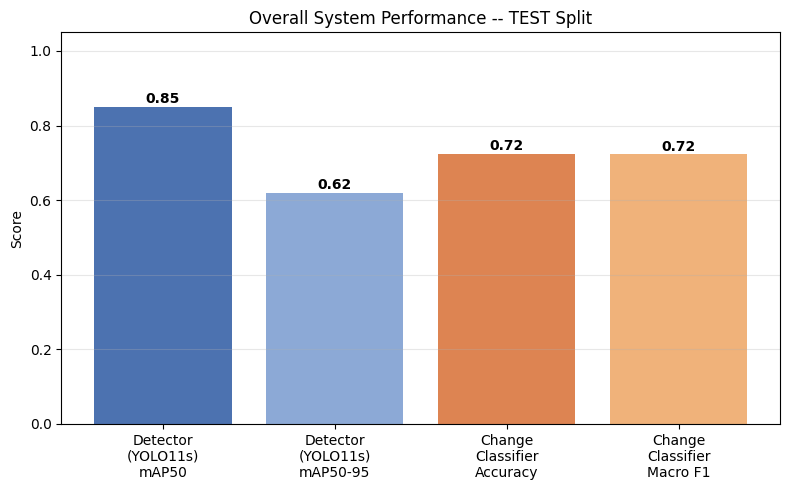

In [45]:
system_summary = pd.DataFrame([
    {'component': 'Detector\n(YOLO11s)', 'metric': 'mAP50',    'score': yolo_test_metrics['mAP50']},
    {'component': 'Detector\n(YOLO11s)', 'metric': 'mAP50-95', 'score': yolo_test_metrics['mAP50-95']},
    {'component': 'Change\nClassifier',  'metric': 'Accuracy', 'score': test_report['accuracy']},
    {'component': 'Change\nClassifier',  'metric': 'Macro F1', 'score': test_report['macro avg']['f1-score']},
])
colors_map = {'mAP50': '#4C72B0', 'mAP50-95': '#8CA9D6', 'Accuracy': '#DD8452', 'Macro F1': '#F0B27A'}

fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(system_summary['component'] + '\n' + system_summary['metric'], system_summary['score'],
              color=[colors_map[m] for m in system_summary['metric']])
for b, v in zip(bars, system_summary['score']):
    ax.text(b.get_x() + b.get_width() / 2, v + 0.01, f'{v:.2f}', ha='center', fontweight='bold')
ax.set_ylim(0, 1.05)
ax.set_ylabel('Score')
ax.set_title('Overall System Performance -- TEST Split')
ax.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.savefig('/content/system_performance_summary.png', dpi=150)
plt.show()

## 15. End-to-End Pipeline Trace (your demo pair)

What each stage receives and returns, all for the single before/after pair you uploaded at the top:

1. **Raw input** — your uploaded before / after photos.
2. **Preprocessed input** — the same pair after CLAHE; this is what YOLO sees.
3. **YOLO output** — `{class, bbox, confidence}` per box, for before and after.
4. **Matching input** — the two box lists, homography `H`, thresholds, pixel arrays.
5. **Matching output** — `matched_pairs` and preliminary `events`; this decides *which object* changed.
6. **Feature row** — one row per pair (Random Forest input).
7. **Random Forest output** — change-type probabilities and the predicted change type.
8. **Object identity** — looked up from the matching events with `object_for_type`; not produced by the Random Forest.
9. **Total system output** — object (from matching) + change type (from the Random Forest) on the annotated pair.

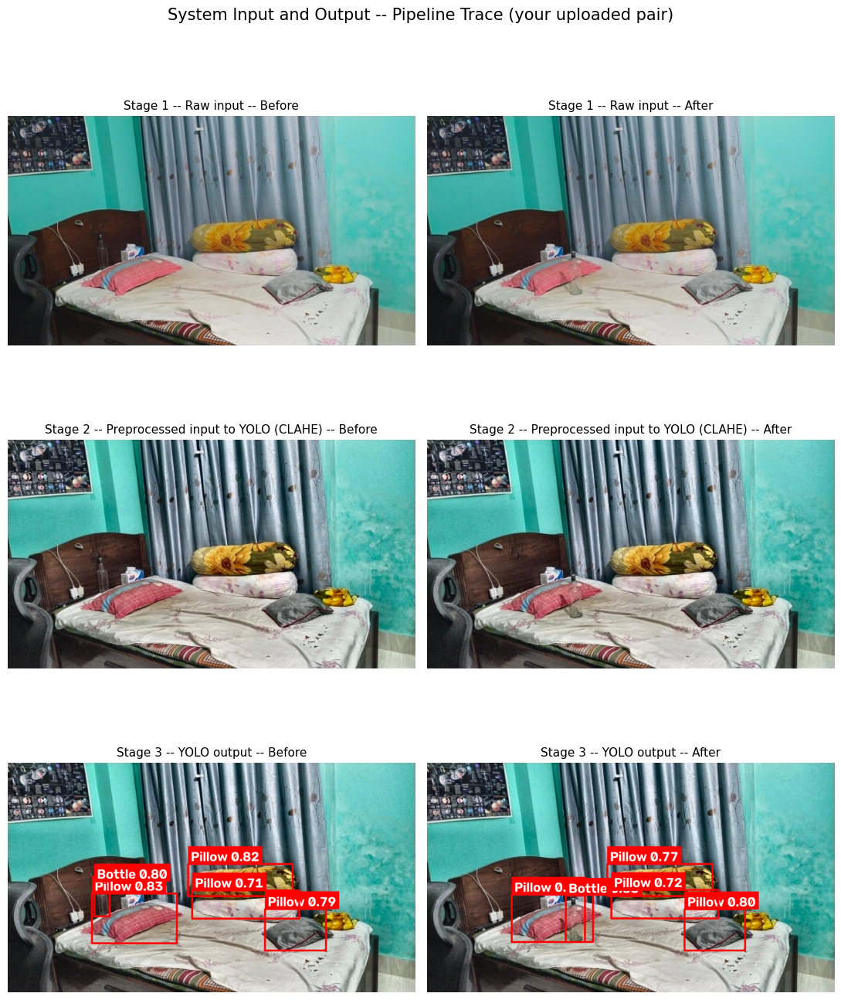

Stage 3 -- YOLO output: before_boxes (5), after_boxes (5)


,class,x1,y1,x2,y2,confidence
0,Pillow,396,616,797,850,0.834
1,Pillow,849,476,1342,627,0.816
2,Bottle,408,558,480,723,0.798
3,Pillow,1211,689,1499,883,0.787
4,Pillow,869,600,1372,733,0.711


,class,x1,y1,x2,y2,confidence
0,Pillow,399,621,781,844,0.829
1,Bottle,654,625,743,843,0.829
2,Pillow,1212,689,1498,883,0.804
3,Pillow,848,476,1343,628,0.772
4,Pillow,867,599,1372,733,0.720



Stage 4 -- Matching input
H (before -> after):
[[          1  1.9227e-17  2.8909e-16]
 [-4.5811e-17           1  2.3131e-14]
 [-1.2444e-19  7.9142e-20           1]]
camera_shift_residual = 0.00px  |  move_thresh = 15.0px  |  image_diag = 2202.9px
max_match_dist_frac = 0.35  |  min_appearance_sim = 0.2
before_img = pixel array (1080, 1920, 3)  |  after_img = pixel array (1080, 1920, 3)

Stage 5 -- Matching output: matched_pairs (5), events (1)


,class,before_bbox,after_bbox,moved_px,appearance_sim,role
0,Pillow,"[396, 616, 797, 850]","[399, 621, 781, 844]",6.5,0.91,unchanged
1,Pillow,"[849, 476, 1342, 627]","[848, 476, 1343, 628]",0.3,1.00,unchanged
2,Pillow,"[1211, 689, 1499, 883]","[1212, 689, 1498, 883]",0.4,0.84,unchanged
3,Pillow,"[869, 600, 1372, 733]","[867, 599, 1372, 733]",1.5,0.98,unchanged
4,Bottle,"[408, 558, 480, 723]","[654, 625, 743, 843]",271.5,0.36,Move


,candidate_type,object,confidence,movement_px
0,Move,Bottle,0.814,271.5



Stage 6 -- Feature row (Random Forest input)


,value
net_count_diff,0.000000
max_iou,0.990030
avg_iou,0.773626
camera_shift_residual_px,0.000000
move_thresh_used,15.000000
n_add,0.000000
n_del,0.000000
n_move,1.000000
best_add_conf,0.000000
best_del_conf,0.000000



Stage 7 -- Random Forest output
    P(Add) = 0.041
    P(Delete) = 0.058
    P(Move) = 0.901
    predicted change type: Move

Stage 8 -- object_for_type('Move', stats, matched_pairs) -> 'Bottle'

Stage 9 -- Total system output: object = 'Bottle' (matching), change type = 'Move' (Random Forest)


In [50]:
def to_rgb(img_bgr):
    return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

def draw_yolo(img_bgr, boxes):
    out = img_bgr.copy()
    for b in boxes:
        draw_labeled_box(out, *b['bbox'], f"{b['class']} {b['confidence']:.2f}", (0, 0, 255))
    return out

# ---- Stages 1-3: raw, preprocessed and YOLO-output images (reusing what was already computed above) ----
stages = [
    ("Stage 1 -- Raw input", cv2.imread(USER_BEFORE_PATH), cv2.imread(USER_AFTER_PATH)),
    ("Stage 2 -- Preprocessed input to YOLO (CLAHE)", demo_before_pre, demo_after_pre),
    ("Stage 3 -- YOLO output", draw_yolo(demo_before_pre, demo_before_boxes), draw_yolo(demo_after_pre, demo_after_boxes)),
]
fig, axes = plt.subplots(len(stages), 2, figsize=(11, 4.6 * len(stages)))
for r, (label, b_img, a_img) in enumerate(stages):
    axes[r, 0].imshow(to_rgb(b_img)); axes[r, 0].axis('off'); axes[r, 0].set_title(f"{label} -- Before", fontsize=11)
    axes[r, 1].imshow(to_rgb(a_img)); axes[r, 1].axis('off'); axes[r, 1].set_title(f"{label} -- After", fontsize=11)
plt.suptitle("System Input and Output -- Pipeline Trace (your uploaded pair)", fontsize=15, y=1.0)
plt.tight_layout()
plt.savefig('/content/system_input_output_trace_user.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Stage 3 -- YOLO output: before_boxes ({len(demo_before_boxes)}), after_boxes ({len(demo_after_boxes)})")
display(boxes_df(demo_before_boxes))
display(boxes_df(demo_after_boxes))

# ---- Stage 4: matching input ----
print("\nStage 4 -- Matching input")
print("H (before -> after):")
print(np.array2string(demo_H, precision=4, suppress_small=True))
print(f"camera_shift_residual = {demo_residual_px:.2f}px  |  move_thresh = {demo_move_thresh:.1f}px  |  "
      f"image_diag = {demo_image_diag:.1f}px")
print(f"max_match_dist_frac = {MAX_MATCH_DIST_FRAC}  |  min_appearance_sim = {MIN_APPEARANCE_SIM}")
print(f"before_img = pixel array {demo_before_pre.shape}  |  after_img = pixel array {demo_after_pre.shape}")

# ---- Stage 5: matching output ----
matched_df, events_df = matching_output_tables(demo_ctx, demo_move_thresh)
print(f"\nStage 5 -- Matching output: matched_pairs ({len(matched_df)}), events ({len(events_df)})")
display(matched_df)
display(events_df)

# ---- Stage 6: feature row (one row for this pair) ----
print("\nStage 6 -- Feature row (Random Forest input)")
display(features(demo_feat_row).T.rename(columns={0: 'value'}))

# ---- Stage 7: Random Forest output ----
x_demo = features(demo_feat_row)
print("\nStage 7 -- Random Forest output")
for cls, p in zip(rf_final.classes_, rf_final.predict_proba(x_demo)[0]):
    print(f"    P({cls}) = {p:.3f}")
predicted_change = rf_final.predict(x_demo)[0]
print(f"    predicted change type: {predicted_change}")

# ---- Stage 8: object identity (from matching, not from the Random Forest) ----
predicted_object = object_for_type(predicted_change, demo_stats, demo_matched_pairs)
print(f"\nStage 8 -- object_for_type({predicted_change!r}, stats, matched_pairs) -> {predicted_object!r}")

# ---- Stage 9: total system output ----
print(f"\nStage 9 -- Total system output: object = {predicted_object!r} (matching), "
      f"change type = {predicted_change!r} (Random Forest)")



## 16. Export

### 16a. WEKA files (CSV + ARFF)

In [47]:
results_df.to_csv('/content/results_full_with_predictions.csv', index=False)

def df_to_arff(df, relation_name, arff_path, numeric_cols, class_col):
    classes = sorted(df[class_col].unique())
    with open(arff_path, 'w') as f:
        f.write(f"@RELATION {relation_name}\n\n")
        for col in numeric_cols:
            f.write(f"@ATTRIBUTE {col} NUMERIC\n")
        f.write(f"@ATTRIBUTE {class_col} {{{','.join(classes)}}}\n\n@DATA\n")
        for _, r in df.iterrows():
            f.write(','.join([str(r[col]) for col in numeric_cols] + [str(r[class_col])]) + '\n')

weka_sets = {'weka_features': ('indoor_change_detection_features', results_df)}
for split_name in ['train', 'validation', 'test']:
    weka_sets[f'weka_features_{split_name}'] = (f'indoor_change_detection_{split_name}',
                                                results_df[results_df['split'] == split_name])
for file_stem, (relation, df) in weka_sets.items():
    part = df[FEATURE_COLS + ['true_change']].copy()
    part[FEATURE_COLS] = part[FEATURE_COLS].fillna(0.0)
    part.to_csv(f'/content/{file_stem}.csv', index=False)
    df_to_arff(part, relation, f'/content/{file_stem}.arff', FEATURE_COLS, 'true_change')
print("Saved: weka_features(.csv/.arff) for all pairs and per split (train / validation / test), "
      "plus results_full_with_predictions.csv.")

Saved: weka_features(.csv/.arff) for all pairs and per split (train / validation / test), plus results_full_with_predictions.csv.


### 16b. Flask deployment bundle

In [48]:
DEPLOY_DIR = '/content/deploy'
shutil.rmtree(DEPLOY_DIR, ignore_errors=True)
os.makedirs(DEPLOY_DIR)

shutil.copy(YOLO_WEIGHTS, os.path.join(DEPLOY_DIR, 'best.pt'))
joblib.dump(rf_final, os.path.join(DEPLOY_DIR, 'rf_classifier.joblib'))

deploy_config = {
    'conf_thresh': CONF_THRESH,
    'move_min_thresh': MOVE_MIN_THRESH,
    'move_safety_factor': MOVE_SAFETY_FACTOR,
    'max_match_dist_frac': MAX_MATCH_DIST_FRAC,
    'min_appearance_sim': MIN_APPEARANCE_SIM,
    'clahe_clip_limit': CLAHE_CLIP_LIMIT,
    'clahe_tile_grid': list(CLAHE_TILE_GRID),
    'feature_cols': FEATURE_COLS,
    'class_names': list(yolo_model.names.values()),
}
with open(os.path.join(DEPLOY_DIR, 'config.json'), 'w') as f:
    json.dump(deploy_config, f, indent=2)

print("Deployment bundle:", sorted(os.listdir(DEPLOY_DIR)))
shutil.make_archive('/content/flask_model_bundle', 'zip', '/content', 'deploy')
files.download('/content/flask_model_bundle.zip')   # unzip into flask_app/model/

Deployment bundle: ['best.pt', 'config.json', 'rf_classifier.joblib']


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 16c. Results archive

In [49]:
RESULTS_DIR = '/content/results'
shutil.rmtree(RESULTS_DIR, ignore_errors=True)
os.makedirs(f'{RESULTS_DIR}/models/yolo11s')
os.makedirs(f'{RESULTS_DIR}/charts')

shutil.copy(YOLO_WEIGHTS, f'{RESULTS_DIR}/models/yolo11s/best.pt')
for png in glob.glob('/content/*.png'):                       # every chart saved by this notebook
    shutil.copy(png, f'{RESULTS_DIR}/charts/')
for pattern in ['weka_features*.csv', 'weka_features*.arff', 'results_full_with_predictions.csv']:
    for path in glob.glob(f'/content/{pattern}'):
        shutil.copy(path, RESULTS_DIR)
shutil.copytree(DEPLOY_DIR, f'{RESULTS_DIR}/deploy')
comparison_df.to_csv(f'{RESULTS_DIR}/model_metrics_validation.csv', index=False)
comparison_test_df.to_csv(f'{RESULTS_DIR}/model_metrics_test.csv', index=False)

shutil.make_archive('/content/results', 'zip', RESULTS_DIR)
files.download('/content/results.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>